# Welcome to our CIS 545 Project!



**Introduction:**

Our goal of this project was to examine public opinion and sentiments about the Ukraine War collected between Feburary 9th to March 31st. We used a following set of keywords to filter the Ukraine war-related tweets: *'ukraine','ukrainian', 'russia', 'russian','putin' 'zelensky'*. Also, we looked at how Twitter influencers (e.g., mainstream news channels, verified Twitter accounts) are related to their followers via sentiment and NLP predictions. 

We incorporated both supervised machine learning models (BERT) and dictionary-based sentiment analyses (Lexicone) to predict sentiments expressed in each tweet and compare similarity/difference across tweets of different influence networks. We end with graph/network visualizations to understand the structural differences among influential social media influencers.

**Data Collection:**

We used Wharton/Annenberg Twitter Database that provides a datset of historical Tweets, representing about 1% of the total Twitter volume tweeted each day. By using SQL queries, we obtained the columns that we need for our analyses. Our SQL query looked as below:

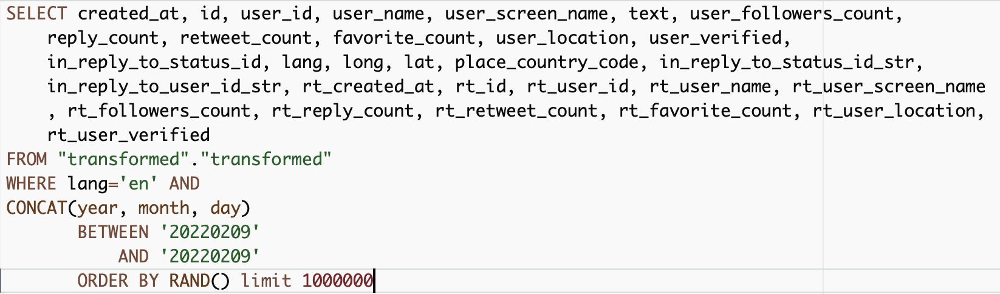

**The SQL Query using Wharton DB gives us ~1,000,000 random subseted of tweets tweeted each day from Feb 9th - March 31st.** The main columns that we have used for our analysis was *created_at*, which indicates the date when each tweet was posted, *user_id*, the IDs of each Twitter user provided by official Twitter API, *text*, the main text of the tweets, *user_location*, the location information provided by each Twitter user where they lcoate at.

**Data Combining:**

From the SQL Query above we varied the dates, and collected multilple CSV files. We then combined all of the CVS files into one CVS file in the notebook titled: **CIS545_Combinding_Relevant_data.ipynb** We filter the CSV files and combine rows that have our key words. Key words are: ['ukraine','ukrainian', 'russia', 'russian','putin' 'zelensky']

**Cleaning Raw Data and Text Filtering**

After collecting only the Ukraine War-related tweets from the CSV files, we cleaned the text before working with NLP/sentiment analyses. The text filtering process can be found in the notebook titled: **CIS545_prepross.ipynb**.

## Importing and Installing Necessary Python Packages

In [ ]:
import pandas as pd
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import numpy as np
import matplotlib.pyplot as plt
nltk.download('punkt')
nltk.__version__
from os import listdir
from os.path import isfile, join
import seaborn as sns
from google.colab import drive
import json

!pip install tensorflow_text
#!pip install tensorflow-gpu==2.3.0
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text as text

from sklearn.model_selection import train_test_split
#!pip install tf-models-official
#from official import nlp

!pip install NRCLex
from nrclex import NRCLex


drive.mount('/content/drive')

# 1) Exploratory Data Analysis (EDA) Time

In [ ]:
df = pd.read_json('/content/drive/MyDrive/CIS 545 project/Ukrain_Russia_tweets_Feb_March_FULLY_Filtered_500K_json.json')
df
#466547 rows × 33 columns

,created_at,id,user_id,user_name,user_screen_name,extended_full_text,user_followers_count,reply_count,retweet_count,favorite_count,...,rt_user_screen_name,rt_followers_count,rt_reply_count,rt_retweet_count,rt_favorite_count,rt_user_location,rt_user_verified,day,total_day_tweets_collected,Filtered_extended_text
0,2022-02-09 18:57:04+00:00,1491486324000000000,1376954378595180544,droptown.io,droptown_io,The Russian government and the Bank of Russia ...,146,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220209,1325849,The Russian government and the Bank of Russia ...
3,2022-02-09 18:11:08+00:00,1491474764000000000,1170848942784995328,Alexander,Alexand65504397,Life Under the Specter of War: Images From Ukr...,7,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220209,1325849,Life Under the Specter of War: Images From Ukr...
5,2022-02-09 01:16:35+00:00,1491219444000000000,1174009099824128000,James Rath,JamesRa27165926,@ani_obsessive I honestly don't think anything...,11,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220209,1325849,I honestly don't think anything can beat the o...
7,2022-02-09 06:53:19+00:00,1491304186000000000,1473016153467506688,Limited USD (LUSD),LimitedCurrency,"@APompliano Hi Pomp, at https://t.co/nT0Pji6SX...",11263,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220209,1325849,"Hi Pomp, at community we just created the Lim..."
13,2022-02-09 06:26:19+00:00,1491297391000000000,92895963,Samar Hashemi,samarhashemi,Another possible doping situation for Russia? ...,231,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220209,1325849,Another possible doping situation for Russia? ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1867809,2022-03-31 14:28:17+00:00,1509538075000000000,27567038,🌻 Russell Hayward 🇺🇦 🇦🇺,russelljh,@thereality031 @Real_Jayant @RT_com Look like ...,1881,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220331,1246965,Look like Russian invaders to me
1867811,2022-03-31 05:29:58+00:00,1509402603000000000,2208091680,Alex True,interpolusa,"The IAEA has 172 employees, 40% of whom are Ru...",513,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220331,1246965,"The IAEA has 172 employees, 40% of whom are Ru..."
1867814,2022-03-31 07:41:44+00:00,1509435764000000000,300812441,Matthias Schulze,perceptic0n,"Google: Russian phishing attacks target NATO, ...",3078,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220331,1246965,"Google: Russian phishing attacks target NATO, ..."
1867815,2022-03-31 18:29:32+00:00,1509598788000000000,29223860,Renee Jarrett,1loneheart,@telegram Could you tell the world why you’ve ...,42,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220331,1246965,Could you tell the world why you’ve removed al...


##1.1) Lets check that the Tweets we collected from Wharton Twitter Data base was equally sampled per day!

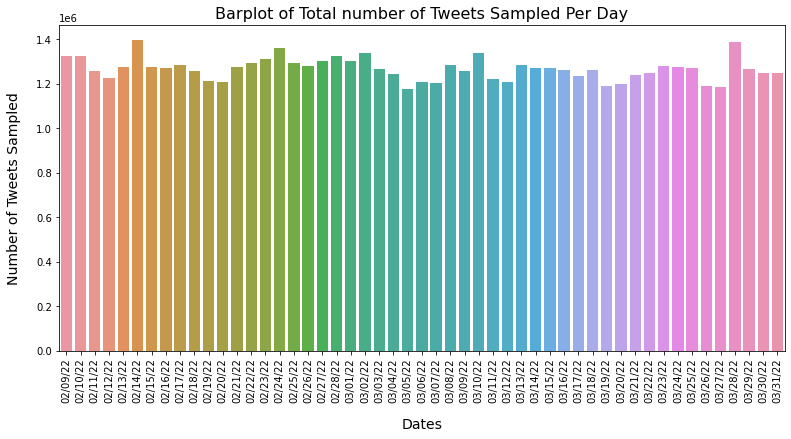

In [ ]:
# Lets make sure we are sampling our tweets evenly!

index = np.logical_not(np.isnan(df['day'].unique()))
days = df['day'].unique()[index]

dates = []
for day in days:
  year = str(day)[0:2]
  month = str(day)[2:4]
  day = str(day)[4:6]
  string_day = str(month) + '/' + str(day) + '/' + str(year)
  dates.append(string_day)

index = np.logical_not(np.isnan(df['total_day_tweets_collected'].unique()))
Num_tweets_sampled = df['total_day_tweets_collected'].unique()[index]


plt.figure(figsize=(13,6))
sns.barplot(x = dates,y = Num_tweets_sampled)
plt.title('Barplot of Total number of Tweets Sampled Per Day', fontsize = 16)
plt.ylabel('Number of Tweets Sampled',labelpad=15,fontsize = 14)
plt.xlabel('Dates', labelpad = 15, fontsize = 14)
plt.xticks(rotation=90)
plt.show()

From this plot we see that we have around 1.2 to 1.6 million tweets per day! So we are confident we are not oversampling for a given day!

##1.2) From the Data Frame (df) we see we have geographical information! Lets create a tokenizer to get User's locations and see where our data is from! We expect english speaking countries due to our Query inputs!

### Define tokenized_locations which tokenizes user_location from df

In [ ]:

def tokenized_locations(content,additional_stop_words = []):

  Token_list = nltk.word_tokenize(content)
  
  filtered_list = []

  for word in Token_list:
    word = word.lower()
    if not word.isalpha():
      continue
    filtered_list.append(word)
    

  return filtered_list 

 

### import us_state and country dictionaries and find what country and what USA state each user comes from!

In [ ]:
# Lets see where our data is comming from!


with open('us_state_to_abbrev.json') as json_file:
  us_state_to_abbrev = json.load(json_file)

with open('country_and_abv.json') as json_file:
  country_and_abv = json.load(json_file)


lower_names = [x.lower() for x in us_state_to_abbrev.keys()]
lower_abrv = [x.lower() for x in us_state_to_abbrev.values()]

country_lower_names = [x.lower() for x in country_and_abv.values()]

Locations = df['user_location']
countries = []
states = []
for area in Locations: 
  tok_loc = tokenized_locations(str(area))
  holder = 0
  for entry in tok_loc:
    if entry in lower_names:
      countries.append('USA')
      states.append(lower_abrv[lower_names.index(entry)].upper())
      holder = 1
      break
    if entry in lower_abrv:
      countries.append('USA')
      states.append(lower_abrv[lower_abrv.index(entry)].upper())

      holder = 1
      break
    
    if entry in ['usa','us']:
      countries.append('USA')
      holder = 1
      break

    if entry in country_lower_names:
      countries.append(country_lower_names[country_lower_names.index(entry)])
      holder = 1
      break

  if holder == 0:
    countries.append('Not Found')
    

# Some fixes, since the above approach fails with multiple word countries!

Locations_df = df[['user_location']].copy()
Locations_df['filt'] = countries

Index = Locations_df['user_location'] == 'United Kingdom'

Locations_df['filt'][Index] = 'united kingdom'

Index = Locations_df['user_location'] == 'United States'

Locations_df['filt'][Index] = 'USA'

Index = Locations_df['filt'] == 'england'

Locations_df['filt'][Index] = 'united kingdom'


### Visualize Geographical Locations

In [ ]:
import plotly
import plotly.express as px
from plotly.subplots import make_subplots


Location_freq = list(Locations_df.groupby(by='filt').count().iloc[1:,0])
Country_list = list(Locations_df.groupby(by='filt').count().iloc[1:,0].index)

Location_freq_df = pd.DataFrame({'Location_freq':Location_freq,'Country':Country_list})
Location_freq_df

fig = px.choropleth(Location_freq_df,locations = 'Country' ,locationmode='country names', color='Location_freq', scope='world')
fig.update_layout(title_text='Frequency of Ukraine-Russian Tweets by Country', title_x=0.5)
fig.layout.coloraxis.colorbar.title = 'Freq.'
fig.show()



/usr/local/lib/python3.7/dist-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


As we can see we have collected mostly from USA! So lets see what the map looks without USA. Also this is expected since we queried for the English language!

In [ ]:
# Remove USA!

fig = px.choropleth(Location_freq_df.iloc[1:,:],locations = 'Country' ,locationmode='country names', color='Location_freq', scope='world')
fig.update_layout(title_text='Frequency of Ukraine-Russian Tweets by Country (USA Tweets Removed)', title_x=0.5)
fig.layout.coloraxis.colorbar.title = 'Freq.'



fig.show()

WOOOOOW! We still see mostly English speaking states. BUT look at UKRAINE!! We got alot of tweets from there! This is kind of expected since we are looking at the Ukraine-Russian War!

Now lets look at the USA states!

In [ ]:
# Now lets look at states!
States_df = pd.DataFrame({'states':states,'count':states}).groupby(by='states').count()
States_df.reset_index(inplace=True)

fig = px.choropleth(States_df,locations = 'states' ,locationmode='USA-states', color='count', scope='usa')
fig.update_layout(title_text='Frequency of Ukraine-Russian Tweets by USA States', title_x=0.5)
fig.layout.coloraxis.colorbar.title = 'Freq.'

fig.show()

As expected, tweets are mostly from USA states with higher population (e.g., California, Texas, Flordia, etc.). Now we will explore how many tweets about the Ukraine War are tweeted per day!

## 1.3) Lets witness how the frequency of tweets related to Ukraine-Russia conflict vary per day!

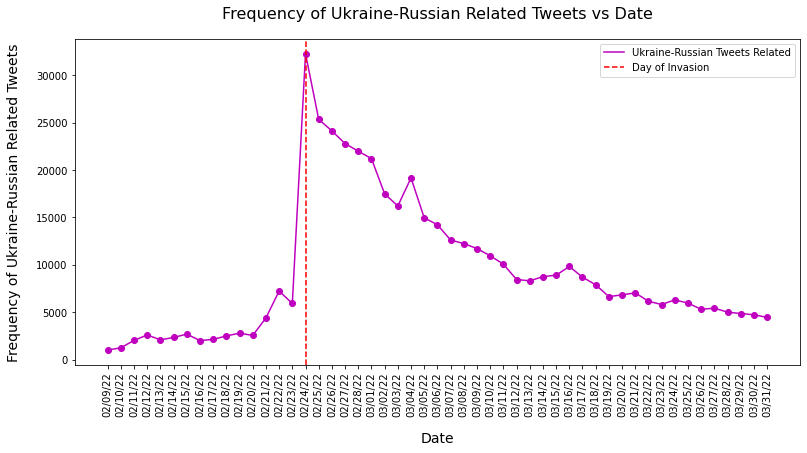

466547

In [ ]:
# Lets plot the Occurance of Ukraine-Russian Related Tweets for the Feb 9th - March 30th

day_count = np.array(df.groupby(by='day').count()['id'])

plt.figure(figsize=(13, 6))
plt.plot(dates,day_count,'o',color = 'm', label = '_nolegend_')
plt.plot(dates,day_count,color = 'm')
plt.title('Frequency of Ukraine-Russian Related Tweets vs Date', fontsize = 16, pad = 20)
plt.ylabel('Frequency of Ukraine-Russian Related Tweets',fontsize = 14, labelpad= 15)
plt.xlabel('Date',fontsize = 14, labelpad= 15)
plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 90-degrees
plt.axvline(x=15,color='red',linestyle='dashed')
plt.legend(['Ukraine-Russian Tweets Related','Day of Invasion'])

plt.show()

np.sum(day_count)

WOW! we see a huge increase when Russia invaded Ukraine, and it looks like the frequency of tweets are slowly decreasing as we move away from the invasion date!

## 1.4) From our data lets witness the top 150 words, and visualize the words in a wordcloud!

### Download stop words as well as twitter_stop_words! Create new function tokenized_content which will tokenize the Filtered_extended_text in df!

In [ ]:
# Lets discover what words are the most common!

from nltk.corpus import stopwords
nltk.download('stopwords')
stopwords = set(stopwords.words('english'))

twitter_txt = open("twitter_stop_words.txt", "r")
twitter_stop = []

for word in twitter_txt:
  twitter_stop.append(word.strip())

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


**Tokenizer here:**

In [ ]:

def tokenized_content(content,additional_stop_words = []):

  Token_list = nltk.word_tokenize(content)
  
  filtered_list = []

  for word in Token_list:
    word = word.lower()
    if word in stopwords:
      continue
    if not word.isalpha():
      continue
    if word in twitter_stop:
      continue
    if word in additional_stop_words:
      continue

    filtered_list.append(word)
    

  return filtered_list 

 

### Create a list called top_tokens where we have a list of all relavent words from our data!

We also generated a list of additional stop words to remove unnecessary texts that do not help us with our analyses (e.g., rt, https, says).

In [ ]:
top_tokens = []
additional_stop_words = ['rt','https','says','one','would','nan','get','new','said','going','want','amp']
Word_series = df['extended_full_text']
for string in Word_series:
  filtered_list = tokenized_content(str(string),additional_stop_words = additional_stop_words)
  for word in filtered_list:
    top_tokens.append(word)

### Find the most frequent words and use wordcloud to visualize!

We do this by counting the frequency of words that appear in top_tokens! Remember top_tokens is a list of all the tokenized words from all the filtered tweets we collected!

In [ ]:
import collections

top_most_common_counter = collections.Counter()

for word in top_tokens:
  top_most_common_counter[word] += 1

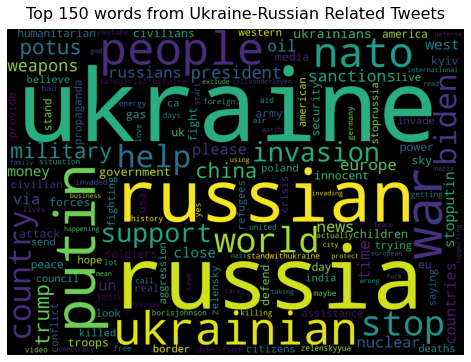

In [ ]:
from wordcloud import WordCloud

top_100 = top_most_common_counter.most_common(150)

wc_top = WordCloud(background_color='black',height=1000,width=1400, max_words=300)

wc_top.generate_from_frequencies(dict(top_100))
plt.figure(figsize=(13, 6))
plt.imshow(wc_top)
plt.title('Top 150 words from Ukraine-Russian Related Tweets', fontsize = 16,pad = 10)
plt.axis('off')
plt.show()

COOOL! We see that the top words are Ukraine, Russia (or relating to their respective nationalities). Moreover, we see intresting words such as help, trump, putin, oil, humanitarism, stopputin, nuclear, china, money!

Now lets see how the top 20 words vary per day!

## 1.5) Using the top 150 words, lets witness how the top 20 words varied per day from Feb 9th- March 31st!

Once again we tokenize the text and count how each of the 20 words vary per day:

In [ ]:
# From the top 20, lets see how the top 20 words varied per day!

top_20 = dict(top_most_common_counter.most_common(20))

list_top_20 = top_20.keys()

dict_top_20_per_day = {}
#print(list_top_20)
for candidate in list_top_20:
  dict_top_20_per_day[candidate] = []



for candidate in list_top_20:
  #print(candidate)
  for day in days:
    index = df['day'] == day
    day_df = df[index]

    extended_text = day_df['extended_full_text']
    counter = 0
    for string in extended_text:
      filtered_list = tokenized_content(str(string),additional_stop_words = additional_stop_words)
      for word in filtered_list:
        if candidate == word:
          counter += 1
    
    dict_top_20_per_day[candidate].append(counter)


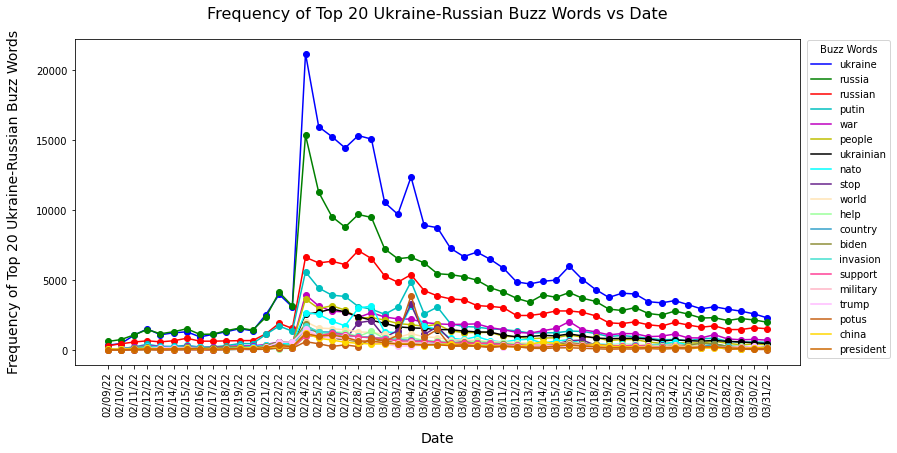

In [ ]:
plt.figure(figsize=(13, 6))
colors = ['b','g','r','c','m','y','k','cyan','#68228B','#FFE4B5','#9AFF9A','#33A1C9','#8E8E38','#40E0D0','#FF3E96','#FFB5C5','#FFBBFF','#C76114','#FFD700','#CD6600']

counter = 0
for i in dict_top_20_per_day.keys():
  color = colors[counter]
  valz = dict_top_20_per_day[i]
  plt.plot(dates,valz,color = color)
  plt.plot(dates,valz,'o',color =color,label='_nolegend_')
  counter +=1

plt.legend(list(dict_top_20_per_day.keys()),loc=(1.01,.02),title = 'Buzz Words')
plt.title('Frequency of Top 20 Ukraine-Russian Buzz Words vs Date', fontsize = 16, pad = 20)
plt.ylabel('Frequency of Top 20 Ukraine-Russian Buzz Words',fontsize = 14, labelpad= 15)
plt.xlabel('Date',fontsize = 14, labelpad= 15)
plt.xticks(rotation = 90) 
plt.show()


Above is a plot that visualizes the top 20 frequent words (i.e., 'buzz words') that have appeared in the twitter dataset we have analyzed so far. In line with the previous frequency plot we have generated, the buzz words appear much more frequently when the war actually begins. We can conlcude that each word follows a similar trend, however the peak differs.

**END OF EDA**

**Starting the Model Process**

#2) Intercoder Reliability

**What is Intercoder Reliability**

Before we predict the opinions/sentiments of each tweet using BERT models, we begin with getting a manually labeled dataset of each opinion and sentiment we are trying to predict. This manually labeled dataset is based on individual labeling by each of our team member. Before labeling a large share of tweets, we first tested whether our team comes up with a good score of intercoder reliability, that is, whether us three labels important variables we are trying to predict in the same way. To test the inter-rater reliability, we randomly sampled 50 tweets from the whole dataset, labeled each of the variable individually, and then compared whether we labeled every variable in the same direction. Please look at notebook: **CIS5454_Intercoder_reliability.ipynb** to see how we got the Intercoder_reliability csv! 



**We explored total 11 variables to estimate the opinions and sentiments surrounding the Ukraine War. We took each tweet as a face value.**

1) *War_related*. If a tweet is related ot the Ukraine War (i.e., the Russian invasion of Ukraine since February 2022), then 1; otherwise 0. If the tweet does ont directly mention the war/invasion (or something related to this conflict), it should be counted as 0.

2) *Pro_ukraine*. If a tweet expresses positive opinions or sentiments toward Ukraine, Zelensky (or Ukrainian political elites), Ukrainian people, or anything related to Ukraine, then 1; otherwise 0. If a tweet only delivers certain facts about what is happening in Ukraine/Russia, not particular opinions or subjective evaluations about the war, it should be coded as 0. Also, the same tweet can be both pro-Ukraine and pro-Russian.

3) *anti_ukraine*. If a tweet expresses negative opinions or sentiments toward Ukraine, Zelensky (or Ukrainian political elites), Ukrainian people, or anything related to Ukraine, then 1; otherwise 0. If a tweet only delivers certain facts about what is happening in Ukraine/Russia, not particular opinions or subjective evaluations about the war, it should be coded as 0. Also, the same tweet can be both pro-Ukraine and pro-Russian.

4) *pro_russia*. If a tweet expresses positive opinions or sentiments toward Russia, Putin (or Russian political elites), Russian people, or anything related to Russia, then 1; otherwise 0. 

5) *anti_russia*. If a tweet expresses negative opinions or sentiments toward Russia, Putin (or Russian political elites), Russian people, or anything related to Russia, then 1; otherwise 0. 

6) *pro_involve*. If a tweet expresses support for Western countries' or organizations' involvement in the Ukraine War (e.g., 'NATO should more intervene in Ukraine,' 'more countries should close the sky above Ukraine,' 'European countries should provide more help to Ukraine'), then 1; otherwise 0. If the tweet does not mention anything about other countries' or organizations' involvement in the war, it should be coded as 0.

7) *anti_involve*. If a tweet expresses opposition to Western countries' or organizations' involvement in the Ukraine War, then 1; otherwise 0.

8) *pro_democrate*. If a tweet expresses positive opinions or sentiments toward the US Democratic Party, Biden (or any other Democratic Party politicians), Biden's decisions, Democratic Party's policies, Democrats, or anything related to the US Democratic Party, then 1; otherwise 0. If a tweet is only saying something positive about the Republican Party but says nothing about the Democratic Party, it should be coded as 0. If a tweet only delivers certain facts about what the Democratic Party or Biden has done, and does not carry particular opinions or subjective evaluations about what they did, it should be coded as 0.

9) *anti_democrate*. If a tweet expresses negative opinions or sentiments toward the US Democratic Party, Biden (or any other Democratic Party politicians), Biden's decisions, Democratic Party's policies, Democrats, or anything related to the US Democratic Party, then 1; otherwise 0.

10) *pro_republican*. If a tweet expresses positive opinions or sentiments toward the US Republican Party, Trump (or any other Republican Party politicians), Trump's decisions, Republican Party's policies, Republicans, or anything related to the US Republican Party, then 1; otherwise 0.

11) *anti_republican*. If a tweet expresses negative opinions or sentiments toward the US Republican Party, Trump (or any other Republican Party politicians), Trump's decisions, Republican Party's policies, Republicans, or anything related to the US Republican Party, then 1; otherwise 0.



Below, we provide how we calculated the intercoder reliability based on Krippendorf's alpha, which is largely used in social sciences to measure inter-rater reliability of manual coded variables. The code to calculate the Krippendorf's was done in R: please see R script **intercoder_reliability_script.R** if intrested or want to see the code in more detail. 

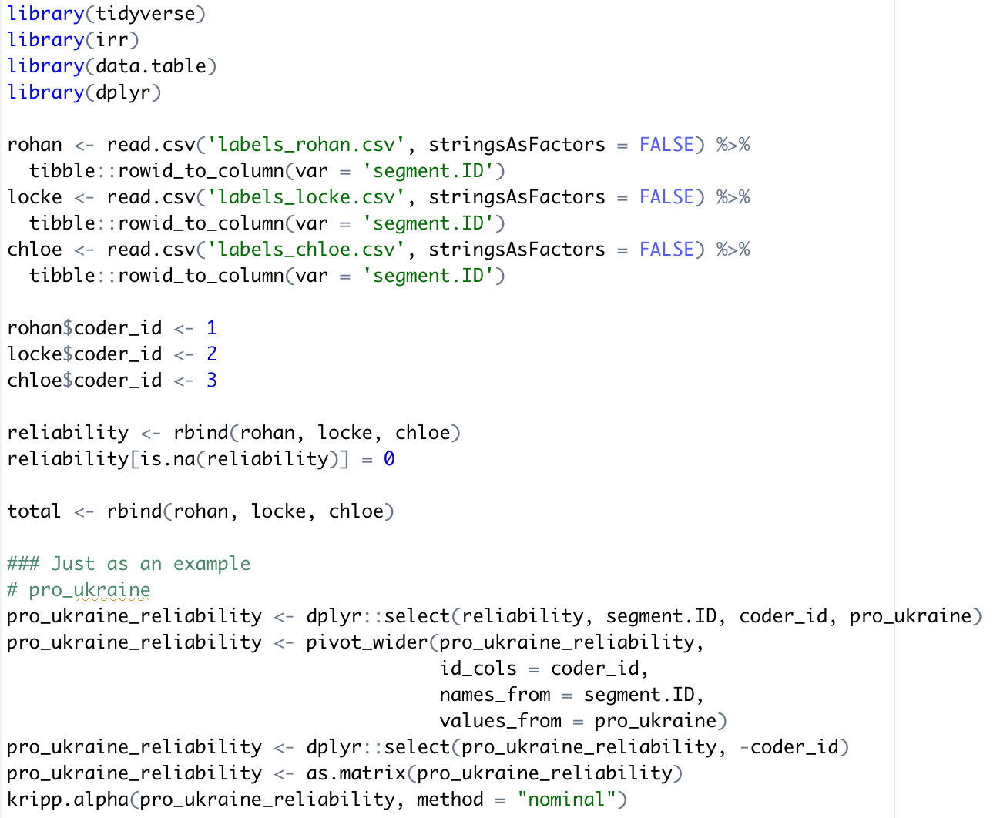

**Results from  Krippendorf's Alpha:**

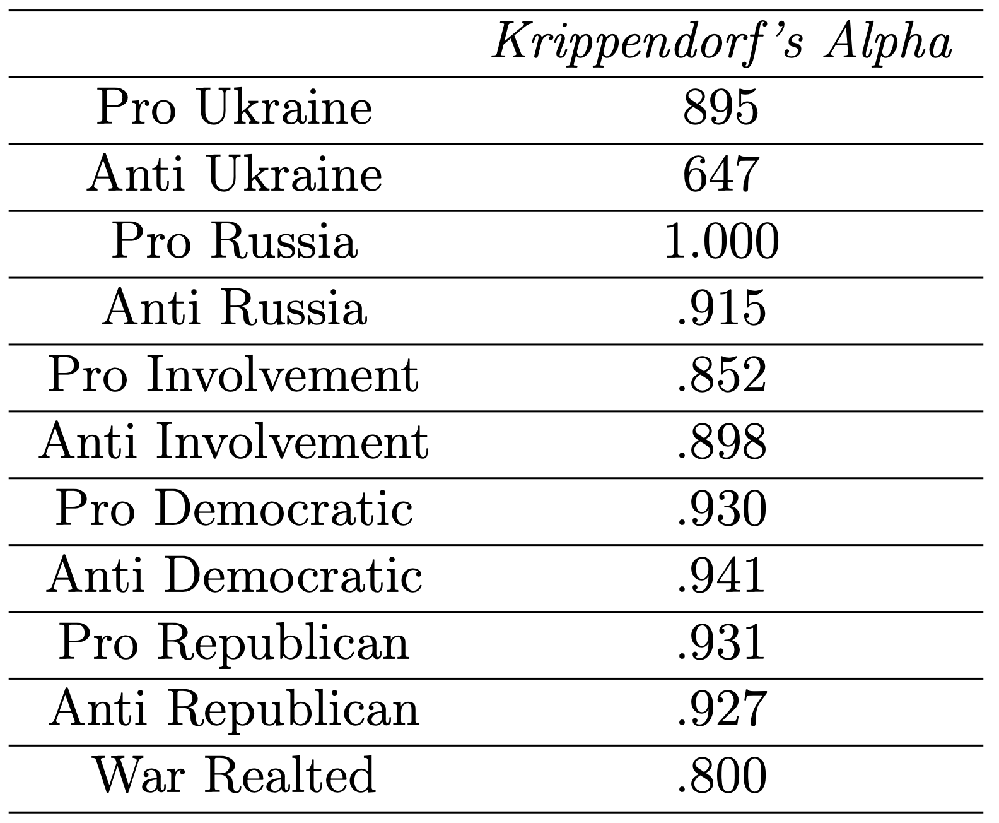

We see from the Krippendorf's Alpha we get high accuracies (above 80%) for each label! However, lets visualize the differences in our intercoder reliability for each person! This is done below:

1) Below we load in each intercoder

2) Plot each intercoder as a 50 x 11 heat map: 50 is the number of tweets and 11 is the labels for the respective tweet!

3) Subtract Chloe Intercoder - .5(Rohan Intercoder + Locke Intercoder) and plot it as Differences of Intercoder

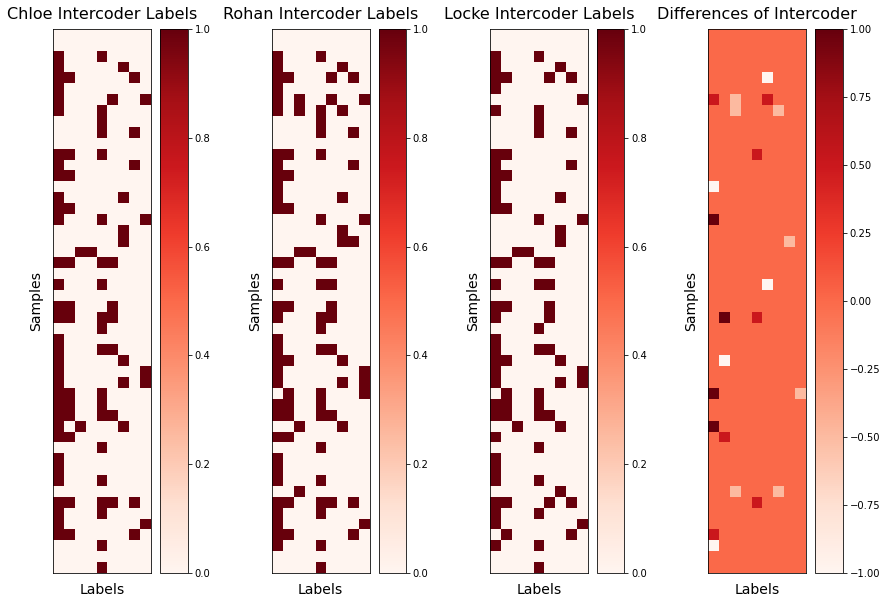

In [ ]:
# Model Training Intercoder Reliabliliy

Chloe_intercoder = np.genfromtxt('labels_chloe.csv',delimiter=',',skip_header=1)
Rohan_intercoder = np.genfromtxt('labels_rohan.csv',delimiter=',',skip_header=1)
Locke_intercoder = np.genfromtxt('labels_locke.csv',delimiter=',',skip_header=1)


fig, (ax1, ax2, ax3, ax4) = plt.subplots(1,4,figsize=(15,10))

map1 = ax1.imshow(Chloe_intercoder, cmap = 'Reds')
ax1.set_title('Chloe Intercoder Labels',fontsize = 16, pad = 10)
ax1.set_ylabel('Samples',fontsize = 14, labelpad = 10)
ax1.set_xlabel('Labels',fontsize = 14,labelpad=10)
ax1.set_xticks([])
ax1.set_yticks([])

map2 = ax2.imshow(Rohan_intercoder, cmap = 'Reds')
ax2.set_title('Rohan Intercoder Labels',fontsize = 16, pad = 10)
ax2.set_ylabel('Samples',fontsize = 14, labelpad = 10)
ax2.set_xlabel('Labels',fontsize = 14,labelpad=10)
ax2.set_xticks([])
ax2.set_yticks([])

map3 = ax3.imshow(Locke_intercoder, cmap = 'Reds')
ax3.set_title('Locke Intercoder Labels',fontsize = 16, pad = 10)
ax3.set_ylabel('Samples',fontsize = 14, labelpad = 10)
ax3.set_xlabel('Labels',fontsize = 14,labelpad=10)
ax3.set_xticks([])
ax3.set_yticks([])


Difference_matrix = (Chloe_intercoder - .5*(Rohan_intercoder + Locke_intercoder))
map4 = ax4.imshow(Difference_matrix, cmap = 'Reds')
ax4.set_title('Differences of Intercoder',fontsize = 16, pad = 10)
ax4.set_ylabel('Samples',fontsize = 14, labelpad = 10)
ax4.set_xlabel('Labels',fontsize = 14,labelpad=10)
ax4.set_xticks([])
ax4.set_yticks([])


fig.colorbar(map1, ax = ax1)
fig.colorbar(map2, ax = ax2)
fig.colorbar(map3, ax = ax3)
fig.colorbar(map4, ax = ax4)


plt.show()

So we can see each of our intercoder heatmaps here! But we get most of our information from the Differences of Intercoder heatmap! Since we did Chloe - .5(Rohan + Locke) we know these rules:

A) 0 are where we all Agree! And this is the Majority :)

B) 1 or -1 is where Locke and Rohan agree and Chloe disagrees

C) .5 or -.5 is where Locke and Rohan disagree and either one of us agree with Chloe


#3) TIME TO TRAIN OUR BERT MODELS!

Lets load in our dataset where we have 11 labels as described in the Intercoder Reliability section:

1) War_related

2) Pro_ukraine

3) anti_ukraine

4) pro_russia

5) anti_russia

6) pro_involve

7) anti_involve

8) pro_democrate

9) anti_democrate

10) pro_republican

11) anti_republican



##3.1) Initial Bert Model based on our labeled Tweets

**Load in training**

Now that we know the intercoder is good! We created a Training/Testing Dataset of 2400 random tweets and we **manually** labeled them! To see how we created the random dataset please look at **CIS5454_Intercoder_reliability.ipynb** sections training/testing and down!

In [ ]:
df_train = pd.read_csv('TRAINING_TEST_Labels_real.csv')
df_train

,Filtered_extended_text,war_related,pro_ukraine,anti_ukraine,pro_russia,anti_russia,pro_involve,anti_involve,pro_dem,anti_dem,pro_rep,anti_rep
0,funny Russia dont speak much just action,0,0,0,0,0,0,0,0,0,0,0
1,Leaving Teacher retirement investments to a Ru...,0,0,0,0,0,0,0,0,0,0,0
2,"#SuperHotDeal - EE Sim Plans - Free Calls, Tex...",0,0,0,0,0,0,0,0,0,0,0
3,#Russia issues threat to #Donbass ceasefire vi...,1,0,0,0,0,0,0,0,0,0,0
4,Yeah... when? We’ve been hearing this shit for...,1,0,0,0,0,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2405,“The evacuation vehicle sent to Volnovakha in ...,1,1,0,0,1,1,0,0,0,0,0
2406,I propose we shame them in public at every opp...,1,1,0,0,1,0,0,0,0,0,0
2407,#WorldWarIII #UkraineRussiaCrisis PEOPLES CAN ...,1,1,0,0,0,0,0,0,0,0,0
2408,Just like those 13( 82 in reality) soldiers fr...,1,0,0,1,0,0,0,0,0,0,0


**Split our training/testing dataset into training and testing! We use test size of 20%**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df_train['Filtered_extended_text'],df_train.iloc[:,1:12],test_size=.2)

### Check the quality of the data we have labeled by Plotting out our Class Balances.

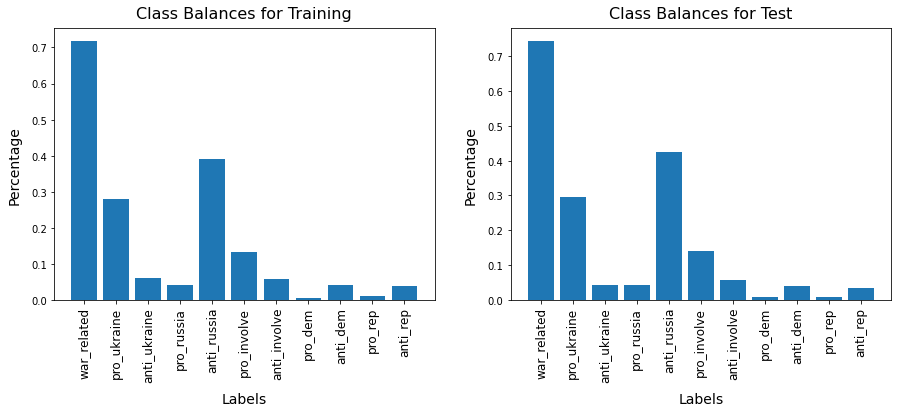

In [ ]:
# Lets check class balances
Training_balance = dict(y_train.sum()/len(y_train))
Testing_balance = dict(y_test.sum()/len(y_test))

f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))
ax1.bar(Training_balance.keys(),Training_balance.values())
ax1.set_xticklabels(Training_balance.keys(), rotation=90, fontsize = 12)
ax1.set_title('Class Balances for Training',fontsize = 16, pad = 10)
ax1.set_xlabel('Labels',fontsize = 14,labelpad=10)
ax1.set_ylabel('Percentage',fontsize = 14, labelpad = 10)


ax2.bar(Testing_balance.keys(),Testing_balance.values())
ax2.set_xticklabels(Testing_balance.keys(), rotation=90, fontsize = 12)
ax2.set_title('Class Balances for Test',fontsize = 16, pad = 10)
ax2.set_xlabel('Labels',fontsize = 14,labelpad=10)
ax2.set_ylabel('Percentage',fontsize = 14, labelpad = 10)


plt.show()

As the two figures above demonstrate, we observe a huge class imbalance. For example, there are much less tweets related to the Democratic/Republican Party or contain Anti-Ukraine or Pro-Russian opinions compared to others. In order to deal with this imabalance, we tried removing labels with low percentages, and sub-sample from high percentages!

###Corrected Class Imbalances by Removing Labels with Low Percentages and sub_sampling from High Percentages

**Correct for class imbalance by removing labels with high majority, and subsetting labels with majorities**

In [ ]:
labels_to_keep = ['Filtered_extended_text','pro_ukraine','anti_ukraine','pro_russia','anti_russia','pro_involve','anti_involve']
df_train_update = df_train[df_train['war_related'] == 1][labels_to_keep]

Min_samples = min(df_train_update.iloc[:,1:6].sum())


df_class_balanced = pd.DataFrame()
for label in labels_to_keep:
  if label == 'Filtered_extended_text':
    continue
  index = df_train_update[label] == 1
  df_train_update[index]
  df_class_balanced = df_class_balanced.append(df_train_update[index].sample(Min_samples))
  index = df_train_update[label] == 0
  df_class_balanced = df_class_balanced.append(df_train_update[index].sample(Min_samples))

remove_n = 150
drop_indices1 = np.random.choice(df_class_balanced[df_class_balanced['pro_ukraine'] == 1].index, remove_n, replace=False)
drop_indices2 = np.random.choice(df_class_balanced[df_class_balanced['anti_russia'] == 1].index, remove_n, replace=False)

drop_indices = np.concatenate((drop_indices1,drop_indices2))
df_subset = df_class_balanced.drop(drop_indices)

X_train, X_test, y_train, y_test = train_test_split(df_subset['Filtered_extended_text'],df_subset.iloc[:,1:8],test_size=.2)


**Recheck Balances**

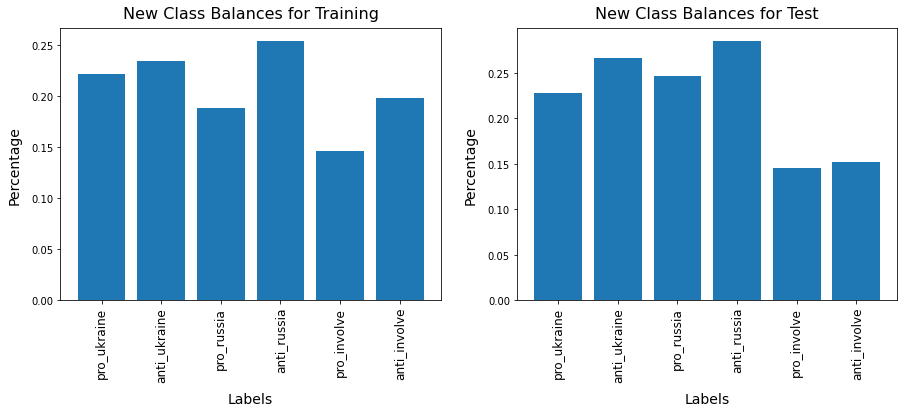

In [ ]:
# Lets re - check class balances
Training_balance = dict(y_train.sum()/len(y_train))
Testing_balance = dict(y_test.sum()/len(y_test))

f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))
ax1.bar(Training_balance.keys(),Training_balance.values())
ax1.set_xticklabels(Training_balance.keys(), rotation=90, fontsize = 12)
ax1.set_title('New Class Balances for Training',fontsize = 16, pad = 10)
ax1.set_xlabel('Labels',fontsize = 14,labelpad=10)
ax1.set_ylabel('Percentage',fontsize = 14, labelpad = 10)


ax2.bar(Testing_balance.keys(),Testing_balance.values())
ax2.set_xticklabels(Testing_balance.keys(), rotation=90, fontsize = 12)
ax2.set_title('New Class Balances for Test',fontsize = 16, pad = 10)
ax2.set_xlabel('Labels',fontsize = 14,labelpad=10)
ax2.set_ylabel('Percentage',fontsize = 14, labelpad = 10)


plt.show()



Ahhh!!! Much more balanced! However we did lose a lot of the data we had previously! Initially we had a training size of 1920, but now we have around 700. We lose a lot of data in order to balance.

##3.2) Constructing our Initial Bert Model

### Build Text Tokenizer and Prepocesser function

**Buling the Preprocesser**

A preprocessor converts raw text to the numeric input tensors expected by the encoder. The encoder then interprets the vectorized raw text, and is able to perform operations on it! 

In [ ]:
tfhub_handle_preprocess = "https://tfhub.dev/tensorflow/bert_en_cased_preprocess/3"

def make_bert_preprocess_model(sentence_features, seq_length= 310):
  """Returns Model mapping string features to BERT inputs.

  Args:
    sentence_features: a list with the names of string-valued features.
    seq_length: an integer that defines the sequence length of BERT inputs.

  Returns:
    A Keras Model that can be called on a list or dict of string Tensors
    (with the order or names, resp., given by sentence_features) and
    returns a dict of tensors for input to BERT.
  """

  input_segments = [
      tf.keras.layers.Input(shape=(), dtype=tf.string, name=ft)
      for ft in sentence_features]

  # Tokenize the text to word pieces.
  bert_preprocess = hub.load(tfhub_handle_preprocess)
  tokenizer = hub.KerasLayer(bert_preprocess.tokenize, name='tokenizer')
  segments = [tokenizer(s) for s in input_segments]

  # Optional: Trim segments in a smart way to fit seq_length.
  # Simple cases (like this example) can skip this step and let
  # the next step apply a default truncation to approximately equal lengths.
  truncated_segments = segments

  # Pack inputs. The details (start/end token ids, dict of output tensors)
  # are model-dependent, so this gets loaded from the SavedModel.
  packer = hub.KerasLayer(bert_preprocess.bert_pack_inputs,
                          arguments=dict(seq_length=seq_length),
                          name='packer')
  model_inputs = packer(truncated_segments)
  return tf.keras.Model(input_segments, model_inputs)

### Call Preprocesser and Encoder from TensorflowHub

In [ ]:
bert_preprocess = make_bert_preprocess_model(['my_input1'])
bert_encoder = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_en_cased_L-12_H-768_A-12/4")

### Build Initial Bert Model

In [ ]:
text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')
preprocessed_text = bert_preprocess(text_input)
outputs = bert_encoder(preprocessed_text)

# Neural network layers
l = tf.keras.layers.Dropout(0.01, name="dropout")(outputs['pooled_output'])
l = tf.keras.layers.Dense(6, activation='softmax', name="output")(l)

# Use inputs and outputs to construct a final model
model = tf.keras.Model(inputs=[text_input], outputs = [l])

Here we bulid our simple model! We have the input being raw text --> vectorized by the bert processor --> transformed by the encoder --> sent into the Bert Layers (Transfer learning) --> 1% dropout --> classification nodes!

Note we also use Adam optimizer, and Softmax activation because we are multi-classification. For loss we use categorical_crossentropy!

### Train and evaluate 

In [ ]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

hist = model.fit(X_train, y_train, epochs=20)


Epoch 1/20
20/20 [==============================] - 35s 2s/step - loss: 2.4532 - accuracy: 0.2032
Epoch 2/20
20/20 [==============================] - 31s 2s/step - loss: 2.2439 - accuracy: 0.2603
Epoch 3/20
20/20 [==============================] - 31s 2s/step - loss: 2.2194 - accuracy: 0.2190
Epoch 4/20
20/20 [==============================] - 31s 2s/step - loss: 2.2056 - accuracy: 0.1841
Epoch 5/20
20/20 [==============================] - 31s 2s/step - loss: 2.1950 - accuracy: 0.2222
Epoch 6/20
20/20 [==============================] - 31s 2s/step - loss: 2.2107 - accuracy: 0.2603
Epoch 7/20
20/20 [==============================] - 31s 2s/step - loss: 2.2172 - accuracy: 0.2651
Epoch 8/20
20/20 [==============================] - 31s 2s/step - loss: 2.1754 - accuracy: 0.2270
Epoch 9/20
20/20 [==============================] - 31s 2s/step - loss: 2.1664 - accuracy: 0.2444
Epoch 10/20
20/20 [==============================] - 31s 2s/step - loss: 2.1480 - accuracy: 0.2746
Epoch 11/20
20/20 [

**Visualize Accuracy and Loss**

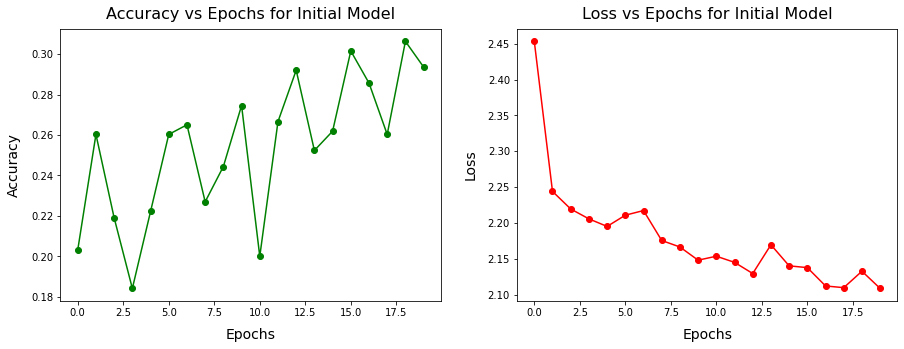

In [ ]:
Initial_model_acc = hist.history['accuracy']
Initial_model_loss = hist.history['loss']


f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))
ax1.plot(Initial_model_acc, color = 'g')
ax1.plot(Initial_model_acc,'go')
ax1.set_title('Accuracy vs Epochs for Initial Model',fontsize = 16, pad = 10)
ax1.set_xlabel('Epochs',fontsize = 14,labelpad=10)
ax1.set_ylabel('Accuracy',fontsize = 14, labelpad = 10)


ax2.plot(Initial_model_loss, color = 'r')
ax2.plot(Initial_model_loss,'ro')
ax2.set_title('Loss vs Epochs for Initial Model',fontsize = 16, pad = 10)
ax2.set_xlabel('Epochs',fontsize = 14,labelpad=10)
ax2.set_ylabel('Loss',fontsize = 14, labelpad = 10)


plt.show()


NOT GOOD due to the class imbalance we lost most of our training data, and our model can not learn!

In [ ]:
model.evaluate(X_test,y_test)

# The evaluation support the previous claims

5/5 [==============================] - 9s 2s/step - loss: 2.2410 - accuracy: 0.2848


[2.2410428524017334, 0.2848101258277893]

**Lets plot a Confusion Matrix to see what our model is predictiing**

In [ ]:
# Confusion Matrix
y_predicted = pd.DataFrame(model.predict(X_test))

y_predicted[0] = y_predicted[0].apply(lambda x: 1 if x > (1/6) else 0)
y_predicted[1] = y_predicted[1].apply(lambda x: 2 if x > (1/6) else 0)
y_predicted[2] = y_predicted[2].apply(lambda x: 3 if x > (1/6) else 0)
y_predicted[3] = y_predicted[3].apply(lambda x: 4 if x > (1/6) else 0)
y_predicted[4] = y_predicted[4].apply(lambda x: 5 if x > (1/6) else 0)
y_predicted[5] = y_predicted[5].apply(lambda x: 6 if x > (1/6) else 0)

y_predicted_flat = np.array(y_predicted).flatten()

y_test['pro_ukraine'] = y_test['pro_ukraine'].apply(lambda x: 1 if x > (1/6) else 0)
y_test['anti_ukraine'] =y_test['anti_ukraine'].apply(lambda x: 2 if x > (1/6) else 0)
y_test['pro_russia'] =y_test['pro_russia'].apply(lambda x: 3 if x > (1/6) else 0)
y_test['anti_russia'] =y_test['anti_russia'].apply(lambda x: 4 if x > (1/6) else 0)
y_test['pro_involve'] =y_test['pro_involve'].apply(lambda x: 5 if x > (1/6) else 0)
y_test['anti_involve'] =y_test['anti_involve'].apply(lambda x: 6 if x > (1/6) else 0)

y_test_flat = np.array(y_test).flatten()

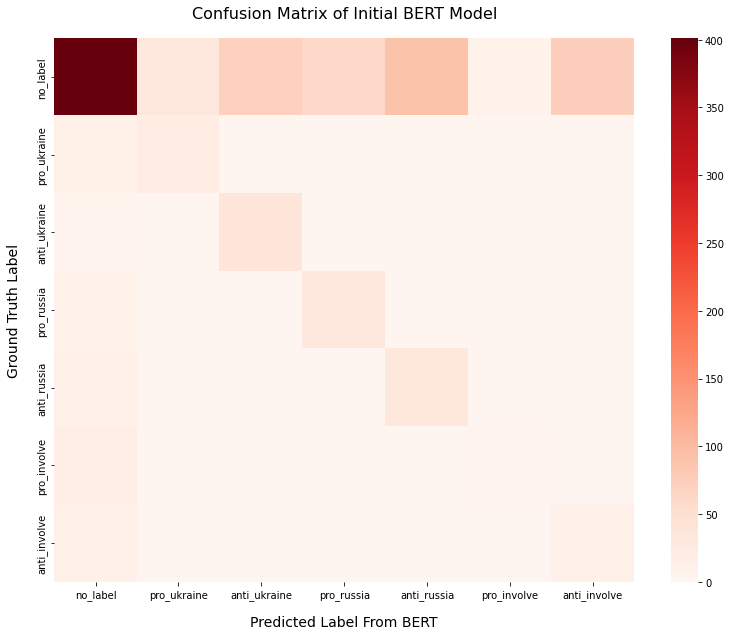

In [ ]:
from sklearn.metrics import confusion_matrix
labels = ['no_label','pro_ukraine','anti_ukraine','pro_russia','anti_russia','pro_involve','anti_involve']
CM__bert_initial = pd.DataFrame(confusion_matrix(y_test_flat, y_predicted_flat),columns=labels,index=labels)

plt.figure(figsize=(13,10))
sns.heatmap(CM__bert_initial,cmap = 'Reds',annot=False) 
# Note I do not want to use annot, makes the graph harder to understand
plt.title('Confusion Matrix of Initial BERT Model',fontsize = 16, pad = 20)
plt.xlabel('Predicted Label From BERT',labelpad=15,fontsize = 14)
plt.ylabel('Ground Truth Label',labelpad=15,fontsize = 14)
plt.show()



**Looks like the model learns to just guess zero! Or that there is no label. This can be due to having a class imbalance of no labels for majority of the text, or the text are neutral!**

If We want to improve this model we can:

1) Get more data

2) Make sure our classes are truely balanced

3) Optimize the Model Architectural 

4) Adjust the weights of the model to accomodate the class imabalances

5) Train for some more epochs (this is not garenteed to improve the model)

6) use other optimizers (not garenteed to improve)



##3.3) New Model based on positive and negative labeled Tweets

**Since our previous model did not work due to class imbalances and a limited data set we sought out to find a new data set** 

We came across a Kaggle Dataset for Labeled Positive and Negative tweets: https://www.kaggle.com/datasets/kazanova/sentiment140

Using this Dataset we want to train a model and then evaluate on our data re-labeled as Positive or Negative and evaluate the generalizability of the model! We believe this will work fine for our data because we have seen that Positive tweets in our data set are symomous for Defending Ukraine, and negative tweets are for Not defending Ukraine. 

**Load in Kaggle Data**

In [ ]:
df_train = pd.read_csv('training.1600000.processed.noemoticon.csv',encoding='ISO-8859-1', names=['target','id','date', 'flag','user','text'])           

**Split Training and Testing**

Note we also only use 5% of the data! This is because this data set has 1.6 million tweets. We dont wanna train forever!

In [ ]:
sample_size = int(len(df_train)*0.05)
sampleDf = df_train.sample(sample_size, random_state=23)
sampleDf['positive'] = sampleDf['target'].apply(lambda x: 1 if x == 4 else 0)
sampleDf['negative'] = sampleDf['target'].apply(lambda x: 1 if x == 0 else 0)

x_train, x_test, y_train, y_test = train_test_split(sampleDf['text'],sampleDf[['positive','negative']], test_size=0.20, random_state=32)

**Lets check class balances**

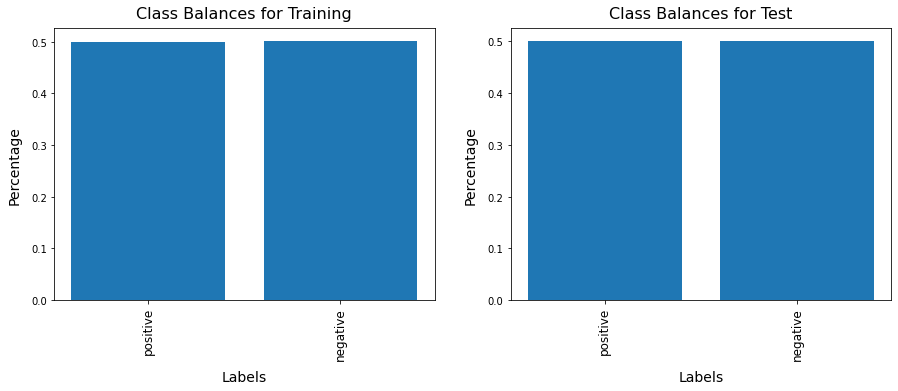

In [ ]:
# Lets check class balances
Training_balance = dict(y_train.sum()/len(y_train))
Testing_balance = dict(y_test.sum()/len(y_test))

f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))
ax1.bar(Training_balance.keys(),Training_balance.values())
ax1.set_xticklabels(Training_balance.keys(), rotation=90, fontsize = 12)
ax1.set_title('Class Balances for Training',fontsize = 16, pad = 10)
ax1.set_xlabel('Labels',fontsize = 14,labelpad=10)
ax1.set_ylabel('Percentage',fontsize = 14, labelpad = 10)


ax2.bar(Testing_balance.keys(),Testing_balance.values())
ax2.set_xticklabels(Testing_balance.keys(), rotation=90, fontsize = 12)
ax2.set_title('Class Balances for Test',fontsize = 16, pad = 10)
ax2.set_xlabel('Labels',fontsize = 14,labelpad=10)
ax2.set_ylabel('Percentage',fontsize = 14, labelpad = 10)


plt.show()


Much more Balanced! We dont need to intervine!

**Build Model**

In [ ]:
text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')
preprocessed_text = bert_preprocess(text_input)
outputs = bert_encoder(preprocessed_text)

# Neural network layers
l = tf.keras.layers.Dropout(0.01, name="dropout")(outputs['pooled_output'])
l = tf.keras.layers.Dense(2, activation='softmax', name="output")(l)

# Use inputs and outputs to construct a final model
model_pos_neg = tf.keras.Model(inputs=[text_input], outputs = [l])

**Train and Evaluate**

In [ ]:
model_pos_neg.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

epochs = 3
batch_size = 16  

history = model_pos_neg.fit(x_train,
                    y_train,
                    epochs=epochs,
                    batch_size = 16,
                    validation_data=(x_test, y_test),
                    verbose=1)


# Save the model so we can use it again!

#model_pos_neg.save("/content/drive/MyDrive/CIS 545 project/twitter_BERT_rohan")

Epoch 1/3
4000/4000 [==============================] - 2152s 535ms/step - loss: 0.5863 - accuracy: 0.6864 - val_loss: 0.5441 - val_accuracy: 0.7286
Epoch 2/3
4000/4000 [==============================] - 2141s 535ms/step - loss: 0.5504 - accuracy: 0.7210 - val_loss: 0.6049 - val_accuracy: 0.6827
Epoch 3/3
4000/4000 [==============================] - 2120s 530ms/step - loss: 0.5423 - accuracy: 0.7278 - val_loss: 0.5359 - val_accuracy: 0.7329


**Visualize Accuracy and Loss**

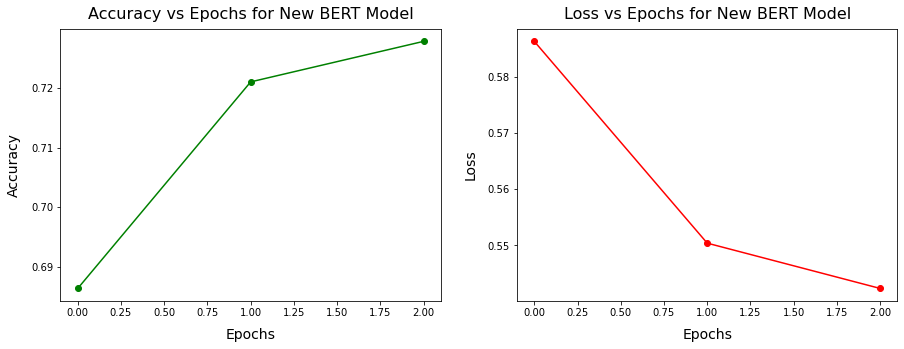

In [ ]:
New_model_acc = history.history['accuracy']
New_model_loss = history.history['loss']


f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))
ax1.plot(New_model_acc, color = 'g')
ax1.plot(New_model_acc,'go')
ax1.set_title('Accuracy vs Epochs for New BERT Model',fontsize = 16, pad = 10)
ax1.set_xlabel('Epochs',fontsize = 14,labelpad=10)
ax1.set_ylabel('Accuracy',fontsize = 14, labelpad = 10)


ax2.plot(New_model_loss, color = 'r')
ax2.plot(New_model_loss,'ro')
ax2.set_title('Loss vs Epochs for New BERT Model',fontsize = 16, pad = 10)
ax2.set_xlabel('Epochs',fontsize = 14,labelpad=10)
ax2.set_ylabel('Loss',fontsize = 14, labelpad = 10)


plt.show()

**Evaluate the New Model on its Testing and Training Set**

In [ ]:
# evaluate on this data set
model_pos_neg.evaluate(x_test,y_test)

500/500 [==============================] - 422s 843ms/step - loss: 0.5359 - accuracy: 0.7329


[0.5359355211257935, 0.7329375147819519]

Note if we want to improve this model we can 

1) optimize the bert structure by potentially adding more dense layers

2) Increase the data we use (right now its 5%)

3) Train for more Epochs (This is not garenteed to improve)

4) Get more data

5) use other optimizers (not garenteed to improve)

**NOW Evaluate the New Model on our RE-labeled Data**

Load in RE-labeled Data

In [ ]:
# evaluate on our data set with re-labels!
df_evaluate = pd.read_csv('TRAINING_TEST_Labels_NEW_MODEL_eval.csv')

X_train = df_evaluate['Filtered_extended_text']
Y_eval = df_evaluate.iloc[:,[1,2]]
df_evaluate

,Filtered_extended_text,Defending Ukraine (Positive),Negative (Not Defending Ukraine)
0,funny Russia dont speak much just action,0,1
1,Leaving Teacher retirement investments to a Ru...,0,1
2,"#SuperHotDeal - EE Sim Plans - Free Calls, Tex...",0,1
3,#Russia issues threat to #Donbass ceasefire vi...,1,0
4,Yeah... when? We’ve been hearing this shit for...,0,1
...,...,...,...
2405,“The evacuation vehicle sent to Volnovakha in ...,1,0
2406,I propose we shame them in public at every opp...,1,0
2407,#WorldWarIII #UkraineRussiaCrisis PEOPLES CAN ...,1,0
2408,Just like those 13( 82 in reality) soldiers fr...,1,0


Evaluate

In [ ]:
# Eval
model_pos_neg.evaluate(X_train,Y_eval)

76/76 [==============================] - 65s 844ms/step - loss: 0.5112 - accuracy: 0.8083


[0.5111690163612366, 0.8082987666130066]

WOW we get approx 80% accuracy! This leads us to believe the model is generalizable to our data!

**To be even more sure lets plot a Confusion Matrix!**

In [ ]:
y_pred = model_pos_neg.predict(X_train)

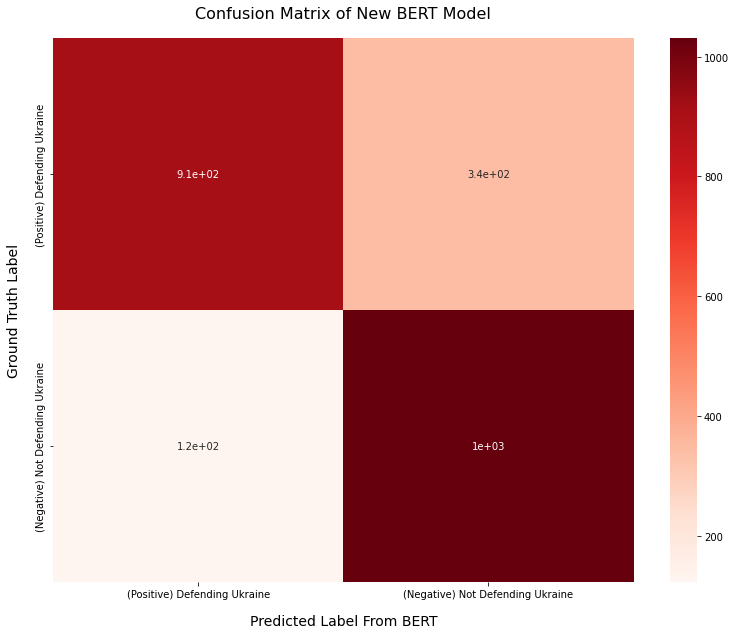

In [ ]:
from sklearn.metrics import confusion_matrix

y_pred_df = pd.DataFrame(y_pred)
y_pred_df[0] = y_pred_df[0].apply(lambda x: 1 if x > .5 else 0)

y_pred_flatt = np.array(y_pred_df[0]).flatten()

ground_truth_flat = np.array(df_evaluate['Defending Ukraine (Positive)']).flatten()

labels = ['(Positive) Defending Ukraine', '(Negative) Not Defending Ukraine']
CM__bert_new = pd.DataFrame(confusion_matrix(ground_truth_flat, y_pred_flatt),columns=labels,index=labels)

plt.figure(figsize=(13,10))
sns.heatmap(CM__bert_new,cmap = 'Reds',annot=True) 
# Note I do not want to use annot, makes the graph harder to understand
plt.title('Confusion Matrix of New BERT Model',fontsize = 16, pad = 20)
plt.xlabel('Predicted Label From BERT',labelpad=15,fontsize = 14)
plt.ylabel('Ground Truth Label',labelpad=15,fontsize = 14)
plt.show()



Amazing From the Confusion Matrix we can see that we get a strong diagonal, meaning that the predictions are matching with the ground truth! We do have a small False positive and decent Flase Negative rate, but for our applications it is tolerable!

# 3) Lexicone approach over than Bert due to Neutral Label

Even though our Bert Model is generalizable to our data set, we noticed the training labels are binary, we only get Positive (Defending Ukraine) or Negative (Not Defending Ukraine). It is largely due to the fact that we have labeled each variable as 0/1, and we have trained BERT models based on logistic regression classifiers. 

Nonetheless, we realized that there were quite many neutral tweets like news reports, factual statements, or breaking news about what is happening in Ukraine/Russia. These tweets were largely left intact in our BERT models as we have not made a distinct category of *neutral* opinions. Since we noticed many nutrual tweets while labeling, we decided to go for a Lexicone Approach.

The Lexicon-based approach uses pre-prepared sentiment dictionary to score a document by aggregating the sentiment scores of all the words in the document. The pre-prepared sentiment lexicon should contain a word and corresponding sentiment score to it. Thus Lexicone approaches have the power to identify Postive, Negative, and NEUTRAl tweets, can not read the context of the sentence like a bert model. While losing the context of each tweet reduces the amount of interpretation we can make out of NLP predictions, sentiment scores are still useful to gauge the overall distribution of opinion sentiments related to the War as they give us a more nuanced picture of how the tweets are discussed in terms of continuous variable (not binary predictors, 0/1).

Load in Lexicone Dictionary:

In [ ]:
nltk.download('vader_lexicon')
sentiments = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


Use the Lexicone Dictionary to look at each tweet and predict sentiments of:


1) Positive

2) Negative

3) Neutral

We call this the Tweet Connotations!

Add the predictions and user_id and filtered_test to a new df called predicted_df

In [ ]:
pos = []
neg = []
neutral = []

for i in df["Filtered_extended_text"]:
  score = sentiments.polarity_scores(i)
  del score['compound']
  max_value = max(score, key=score.get)
  #print(max_value)
  if max_value == 'neg':
    neg.append(1)
    pos.append(0)
    neutral.append(0)
  elif max_value == 'pos':
    neg.append(0)
    pos.append(1)
    neutral.append(0)
  elif max_value == 'neu':
    neg.append(0)
    pos.append(0)
    neutral.append(1)

predicted_df = df[['user_id','Filtered_extended_text']].copy()
predicted_df['nuetral'] = neutral
predicted_df['negative'] = neg
predicted_df['positive'] = pos

predicted_df

,user_id,Filtered_extended_text,nuetral,negative,positive
0,1376954378595180544,The Russian government and the Bank of Russia ...,1,0,0
3,1170848942784995328,Life Under the Specter of War: Images From Ukr...,1,0,0
5,1174009099824128000,I honestly don't think anything can beat the o...,1,0,0
7,1473016153467506688,"Hi Pomp, at community we just created the Lim...",1,0,0
13,92895963,Another possible doping situation for Russia? ...,1,0,0
...,...,...,...,...,...
1867809,27567038,Look like Russian invaders to me,1,0,0
1867811,2208091680,"The IAEA has 172 employees, 40% of whom are Ru...",1,0,0
1867814,300812441,"Google: Russian phishing attacks target NATO, ...",1,0,0
1867815,29223860,Could you tell the world why you’ve removed al...,1,0,0


#4) Predicting Emotions via a lexicon approach!

Similarly we can use a lexicon approach to predict emotions! We load in a new lexicone emotion dictionary from NRCLex and use it for to predict emotions for each tweet!

Emotions consist of:

1) Fear

2) Trust

3) Anger

4) Anticipation

5) Sadness

6) Suprise

7) Disgust

8) Joy

We call these Emotions

Add the predictions and user_id and filtered_test to a new df called predicted_df

In [ ]:
emotion_dic = {'fear':[], 'trust':[], 'anger':[], 'anticipation':[], 'sadness':[], 'surprise':[], 'disgust':[], 'joy':[]}

# Note Joy is also classified as hopful in the Documentation!

for i in df["Filtered_extended_text"]:
  emotion = NRCLex(i.lower())
  score = emotion.raw_emotion_scores
  
  emotion_list = np.array(list(score.keys()))
  freq_list = np.array(list(score.values())) 
  
  try:
    max_freq = max(freq_list)
  except:
    max_freq = 0
  
  space = np.linspace(0,max_freq)

  thresh = np.quantile(space,.5)
  
  top_emotions = emotion_list[freq_list >= thresh]

  if ('anger' in top_emotions) and ('joy' in top_emotions):
    index = top_emotions != 'joy'
    top_emotions = top_emotions[index]

  
  for emotion in emotion_dic.keys():
    if emotion in top_emotions:
      emotion_dic[emotion].append(1)
    else:
      emotion_dic[emotion].append(0)



for emotion in emotion_dic.keys():
  predicted_df[emotion] = emotion_dic[emotion]


predicted_df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


,user_id,Filtered_extended_text,nuetral,negative,positive,fear,trust,anger,anticipation,sadness,surprise,disgust,joy
0,1376954378595180544,The Russian government and the Bank of Russia ...,1,0,0,1,1,0,0,0,0,0,0
3,1170848942784995328,Life Under the Specter of War: Images From Ukr...,1,0,0,1,0,0,0,1,0,0,0
5,1174009099824128000,I honestly don't think anything can beat the o...,1,0,0,0,0,0,0,0,0,0,0
7,1473016153467506688,"Hi Pomp, at community we just created the Lim...",1,0,0,0,0,0,0,0,0,0,0
13,92895963,Another possible doping situation for Russia? ...,1,0,0,1,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1867809,27567038,Look like Russian invaders to me,1,0,0,0,0,0,0,0,0,0,0
1867811,2208091680,"The IAEA has 172 employees, 40% of whom are Ru...",1,0,0,1,0,1,0,0,0,0,0
1867814,300812441,"Google: Russian phishing attacks target NATO, ...",1,0,0,1,0,0,0,0,0,0,0
1867815,29223860,Could you tell the world why you’ve removed al...,1,0,0,1,1,0,0,0,0,0,0


As we see, **predicted_df** is a df with the User_id, Filtered text, and predictions!

#5) Now that we have predicted labels for Tweets lets take a deeper look!

##5.1) Lets looks at the Percentage of Tweet Connotations and Emotions

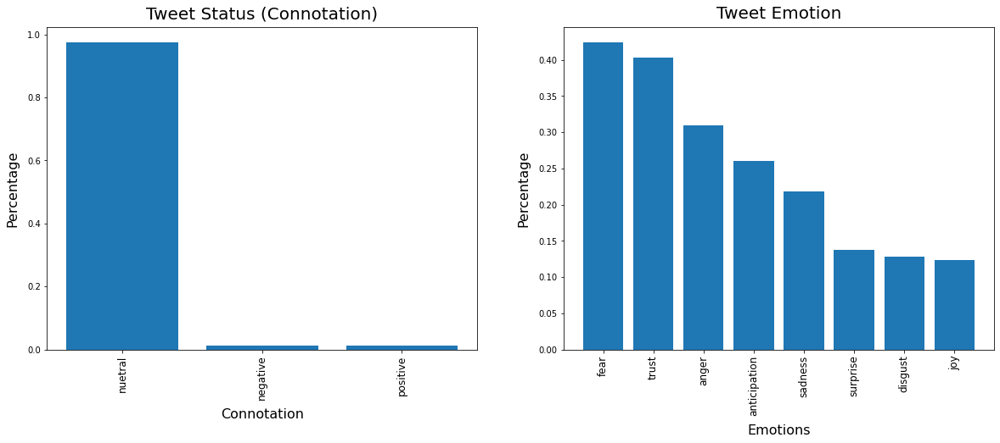

In [ ]:
Tweet_status = dict(predicted_df.iloc[:,2:5].sum()/len(predicted_df))
Tweet_emotion = dict(predicted_df.iloc[:,5:13].sum()/len(predicted_df))


f, (ax1, ax2) = plt.subplots(1, 2,figsize=(20,7))
ax1.bar(Tweet_status.keys(),Tweet_status.values())
ax1.set_xticklabels(Tweet_status.keys(), rotation=90, fontsize = 12)
ax1.set_title('Tweet Status (Connotation)',fontsize = 20, pad = 10)
ax1.set_xlabel('Connotation',fontsize = 16,labelpad=10)
ax1.set_ylabel('Percentage',fontsize = 16, labelpad = 10)


ax2.bar(Tweet_emotion.keys(),Tweet_emotion.values())
ax2.set_xticklabels(Tweet_emotion.keys(), rotation=90, fontsize = 12)
ax2.set_title('Tweet Emotion',fontsize = 20, pad = 10)
ax2.set_xlabel('Emotions',fontsize = 16,labelpad=10)
ax2.set_ylabel('Percentage',fontsize = 16, labelpad = 10)

plt.show()

The figures above show the Connotations and Emotions of the Ukraine War related tweets we have collected. The left panel, which visualizes the percentage of neutral/negative/positive emotions of the total tweets, shows that most of the tweets are neither completely negative nor postivie but mostly on the middle ground, that is, they are mostly moderate about the War. The right panel shows that the War-related tweets frequently show emotions like fear, trust, anger, and anticipation.

 Below, we provide word cloud images to visualize how each emotions are expressed via specific words in a tweet.

##5.2) Lets look at the most common words in each label!

In [ ]:
word_label_dic = {'nuetral':[],'negative':[],'positive':[],'fear':[], 'trust':[], 'anger':[], 'anticipation':[], 'sadness':[], 'surprise':[], 'disgust':[], 'joy':[]}
additional_stop_words = ['rt','https','says','one','would','nan','get','new','said','going','want','amp','via']

N = len(predicted_df)

for i in range(N):
  curr_row = predicted_df.iloc[i]
  string = curr_row['Filtered_extended_text']
  Index = (predicted_df.iloc[i] == 1)
  Relavent_labels = predicted_df.iloc[0].index[Index]
  filtered_list = tokenized_content(string,additional_stop_words = additional_stop_words)
  for word in filtered_list:
    for r_lab in Relavent_labels:
      word_label_dic[r_lab].append(word)

In [ ]:
# Time to count the frequencies for each label!

word_label_counter_dic = {}

for lab in word_label_dic.keys():
  temp_counter = collections.Counter()
  for word in word_label_dic[lab]:
    temp_counter[word] += 1
  
  word_label_counter_dic[lab] = temp_counter


### visualizing the top words from Connotations 

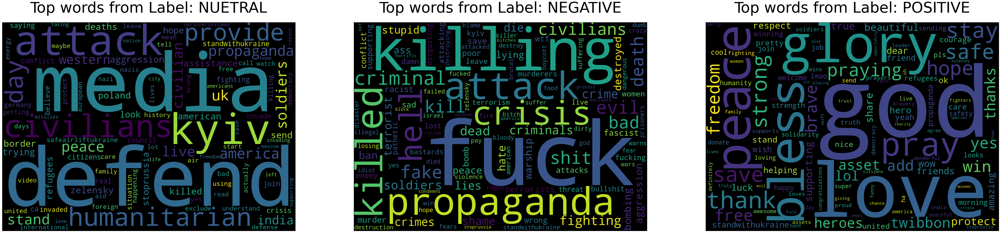

In [ ]:
fig, axs = plt.subplots(1, 3, figsize = (90,70))
x = 0
for lab in list(word_label_counter_dic.keys())[0:3]:
  temp = dict(word_label_counter_dic[lab].most_common(150))
  # Deleting the top 50 most common from EDA
  for key in list(dict(top_100).keys())[0:50]:
    try:
      del temp[key]
    except:
      continue
  wc_top = WordCloud(background_color='black',height=1000,width=1400, max_words=300)
  wc_top.generate_from_frequencies(temp)
  axs[x].imshow(wc_top)
  axs[x].set_title('Top words from Label: ' + lab.upper(), fontsize = 75,pad = 50)
  axs[x].set_xticks([])
  axs[x].set_yticks([])  
  x +=1

plt.show()


Its really cool to see how each connotations have such different words!!!

### Visualizing top words from Emotions

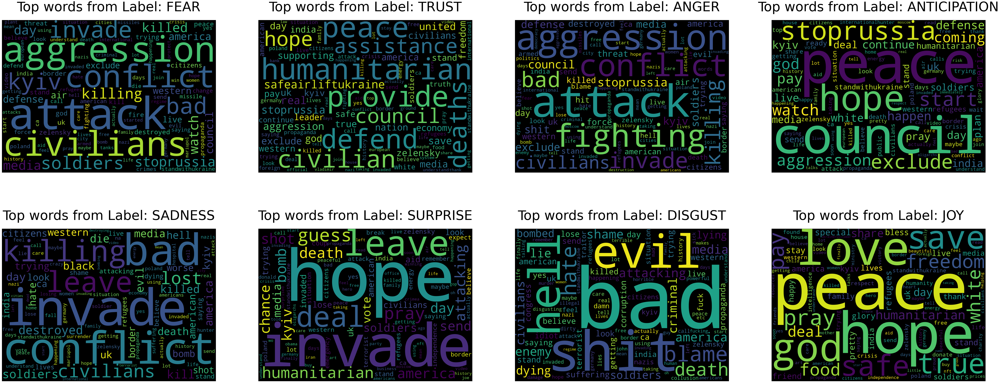

In [ ]:
fig, axs = plt.subplots(2, 4, figsize = (100,40))


# Plotting the first 4 emotions
x = 0
y = 0
for lab in list(word_label_counter_dic.keys())[3:11]:
  temp = dict(word_label_counter_dic[lab].most_common(150))
  # Deleting the top 50 most common from EDA
  for key in list(dict(top_100).keys())[0:50]:
    try:
      del temp[key]
    except:
      continue
  wc_top = WordCloud(background_color='black',height=1000,width=1400, max_words=300)
  wc_top.generate_from_frequencies(temp)
  axs[y,x].imshow(wc_top)
  axs[y,x].set_title('Top words from Label: ' + lab.upper(), fontsize = 75,pad = 50)
  axs[y,x].set_xticks([])
  axs[y,x].set_yticks([]) 
  if x == 3:
    x = -1
    y = 1
  x +=1
fig.show()


Likewise!! The different emotions have such different words assoicated with them! How COOL IS THIS!!!

#6) Connecting Followers to Following

##6.1) Do Followers share the same opinion?

1) Lets find a time range in which the Ukraine-Russian Tweets are high! (2/22-3/15)


2) Lets then take the top N verified followers from this list, and link them to their followers! We can link via Unverified_user_following jsons files!
These files showcase unverified followers from our dataset and who they follow.

Will we see that the follower's opinions for each label will match the Verified user?

4) lets first compile ALL opinions from Verified-Following relationships and see the percentage that Agree and Disagree!

6) Is there a particular label that people disagree or agree with?

5) lets take a deeper look and look at how each opinions for the top 5 Verified-Following Relationship compare to their followers

### Visualizing Time Range of Intrest!

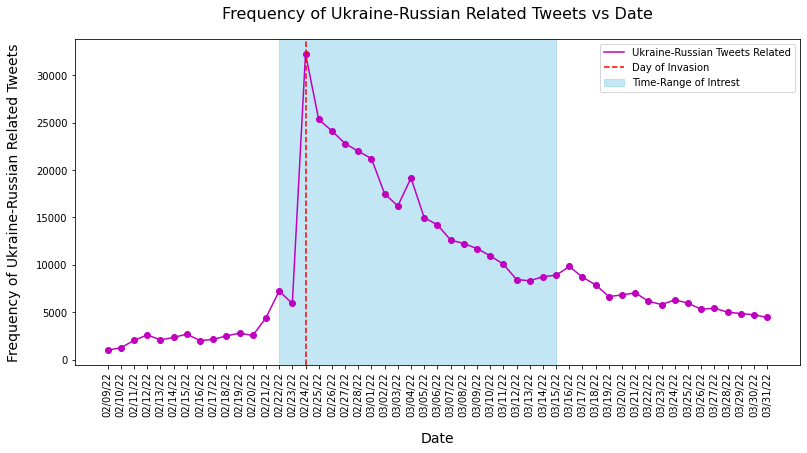

466547

In [ ]:
# Visualization of the time frame we are looking at!

day_count = np.array(df.groupby(by='day').count()['id'])

plt.figure(figsize=(13, 6))
plt.plot(dates,day_count,'o',color = 'm', label = '_nolegend_')
plt.plot(dates,day_count,color = 'm')
plt.title('Frequency of Ukraine-Russian Related Tweets vs Date', fontsize = 16, pad = 20)
plt.ylabel('Frequency of Ukraine-Russian Related Tweets',fontsize = 14, labelpad= 15)
plt.xlabel('Date',fontsize = 14, labelpad= 15)
plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 90-degrees
plt.axvline(x=15,color='red',linestyle='dashed')
plt.axvspan(13, 34, alpha=0.5, color='skyblue')
plt.legend(['Ukraine-Russian Tweets Related','Day of Invasion','Time-Range of Intrest'])

plt.show()

np.sum(day_count)

### Connecting Verified with Followers

Load in json files where the keys are users and their values is the list of poeple they follow. This data was **Scraped** using official Twitter APIs! Please check out notebook: **Follower_info.ipynb** to see scraping code!

In [ ]:
# Loading in a subsample of unverified user's following!

with open('Unverified_user_following_final.json') as json_file:
    unver_following = json.load(json_file)


with open('Unverified_user_following_2_Rando_final.json') as json_file:
    unver_following_2 = json.load(json_file)


unver_following.update(unver_following_2)

Create a dataframe with verified people from our data, and their user_id

In [ ]:
Index  = (df['user_verified'] == 1) & (df['day'] <= 220315) & (df['day'] >= 220222)

Verified_df = df[Index][['user_id','user_screen_name','Filtered_extended_text','user_followers_count']]

Verified_df = Verified_df.sort_values(by = 'user_followers_count', ascending=False)

user_id = Verified_df['user_id'].unique()
user_name = Verified_df['user_screen_name'].unique()

id_name_df = pd.DataFrame({'user_id':user_id,'user_name':user_name})

id_name_df

,user_id,user_name
0,428333,cnnbrk
1,759251,CNN
2,807095,nytimes
3,5402612,BBCBreaking
4,742143,BBCWorld
...,...,...
6191,1127143755499225088,TUCIOfficial
6192,1354375054109401088,CityIndexSG
6193,839312384657338368,Bill_4_Congress
6194,1303584169143001088,UKRinALB


Iteratively look to see if a verified user is in an unverified following list. If so then make a new Dict called **Verified_follower_dic_all** where the key is the verified user_id, and the values are a list of users that follow! 

In [ ]:
Verified_follower_dic_all = {}

ver_user_ids = list(id_name_df['user_id'])

for ver_user in ver_user_ids:
  Verified_follower_dic_all[ver_user] = []
  for key in unver_following.keys():
    array = unver_following[key]
    if ver_user in array:
      Verified_follower_dic_all[int(ver_user)].append(int(key))

### Compile ALL opinions from Verified-Following relationships and see the percentage that Agree and Disagree! Combine the percentages from each relationship to get a global Agree % and Disagree %!

Using **Verified_follower_dic_all** find the Verified user's opinions and see how their opinions correspond to their follower. Then aggregate for all relationships into a global Agree or Disagree

In [ ]:
agree = 0
disagree = 0
for Verified in Verified_follower_dic_all:
   index = predicted_df['user_id'] == Verified
   df_of_verified = predicted_df[index]
   A = (df_of_verified.iloc[:,2:13].sum() >= 1) * 1 
   
   for entry in Verified_follower_dic_all[Verified]:
     
     index = predicted_df['user_id'] == entry
     df_of_user = predicted_df[index]
     B = (df_of_user.iloc[:,2:13].sum() >= 1) * 1
     disagree += sum((A - B) != 0)
     agree += sum((A - B) == 0)

     # Should add to 11 since we have 11 labels


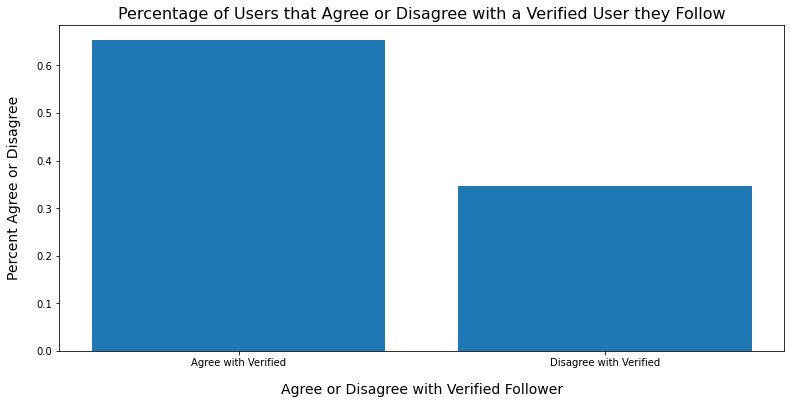

In [ ]:
tot = agree + disagree
percent_agree_or_dis = [agree/tot, disagree/tot]

plt.figure(figsize=(13,6))
plt.bar(['Agree with Verified','Disagree with Verified'],percent_agree_or_dis)
plt.title('Percentage of Users that Agree or Disagree with a Verified User they Follow', fontsize = 16)
plt.xlabel('Agree or Disagree with Verified Follower',labelpad = 15, fontsize = 14)
plt.ylabel('Percent Agree or Disagree',labelpad = 15, fontsize = 14)
plt.show()

AWESOME! From this we see that most followers agree with the opinion of the verified user they follow! But do you think that specific labels might have different outcomes??

### Lets see if any specific Labels have higher percentage of Agree or Disagree!

Using **Verified_follower_dic_all** find the Verified user's opinions and see how their opinions correspond to their follower ACCORDING to label. Then aggregate for all relationships into a global Agree or Disagree **per label!**

In [ ]:
Agree_label_dic = {'nuetral':0,'negative':0,'positive':0,'fear':0, 'trust':0, 'anger':0, 'anticipation':0, 'sadness':0, 'surprise':0, 'disgust':0, 'joy':0}
Disagree_label_dic = {'nuetral':0,'negative':0,'positive':0,'fear':0, 'trust':0, 'anger':0, 'anticipation':0, 'sadness':0, 'surprise':0, 'disgust':0, 'joy':0}
label_list = list(Agree_label_dic.keys())

for Verified in Verified_follower_dic_all:
   index = predicted_df['user_id'] == Verified
   df_of_verified = predicted_df[index]
   A = (df_of_verified.iloc[:,2:13].sum() >= 1) * 1 
   
   for entry in Verified_follower_dic_all[Verified]:
     
     index = predicted_df['user_id'] == entry
     df_of_user = predicted_df[index]
     B = (df_of_user.iloc[:,2:13].sum() >= 1) * 1

     Agree_Index = np.where(((A - B) == 0) == True)[0]
     
     for i in Agree_Index:
       key = label_list[i]
       Agree_label_dic[key] += 1
     
     Disagree_Index = np.where(((A - B) != 0) == True)[0]

     for i in Disagree_Index:
       key = label_list[i]
       Disagree_label_dic[key] += 1



**Visualizing for Connotation**

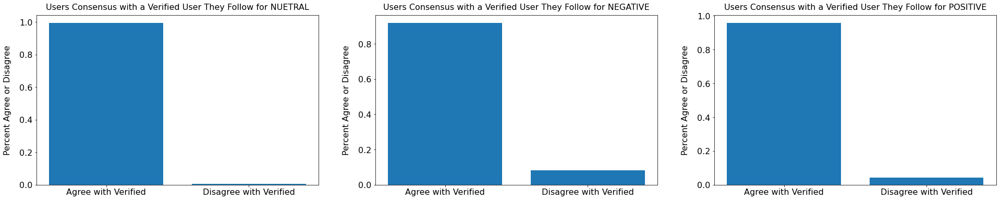

In [ ]:
# Connotation
fig, axs = plt.subplots(1, 3, figsize = (33,6))
connotations = label_list[0:3]

counter = 0
for con in connotations:
  tot = Agree_label_dic[con] + Disagree_label_dic[con]
  sub_percent = [Agree_label_dic[con]/tot,Disagree_label_dic[con]/tot]

  axs[counter].bar(['Agree with Verified','Disagree with Verified'],sub_percent)
  axs[counter].set_title('Users Consensus with a Verified User They Follow for ' + con.upper(), fontsize = 16, pad = 10)
  axs[counter].set_ylabel('Percent Agree or Disagree',labelpad = 15, fontsize = 16)
  axs[counter].tick_params(labelsize = 16)

  counter += 1

plt.show()

**Visualizing for Emotions**

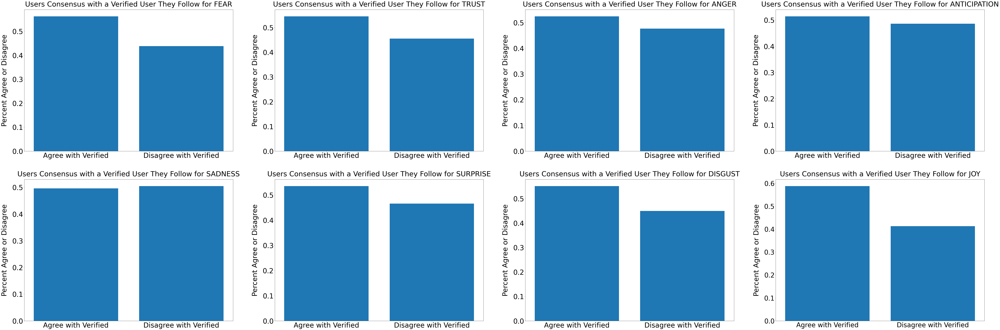

In [ ]:
# Emotions

fig, axs = plt.subplots(2, 4, figsize = (105,35))


# Plotting the first 4 emotions
x = 0
y = 0

connotations = label_list[3:11]

for con in connotations:
  tot = Agree_label_dic[con] + Disagree_label_dic[con]
  sub_percent = [Agree_label_dic[con]/tot,Disagree_label_dic[con]/tot]

  axs[y,x].bar(['Agree with Verified','Disagree with Verified'],sub_percent)
  axs[y,x].set_title('Users Consensus with a Verified User They Follow for ' + con.upper(), fontsize = 43, pad = 20)
  axs[y,x].set_ylabel('Percent Agree or Disagree',labelpad = 25, fontsize = 43)
  axs[y,x].tick_params(labelsize = 42)
  if x == 3:
    x = -1
    y = 1

  x += 1

plt.tick_params(axis='both', which='major', labelsize=40)
plt.show()


**WOW OH WOW!** What we see from here is that per label, most users agree with the Connotaiton, HOWEVER when it comes to emotion it is a toss up! 

### Now for the top 5 Verified-Following Relationships (determined by highest verified follower) compare their follower's opinion to their own opinion. Do this per label as well!

1) Plot the network of the Verified user to their followers 

2) Under their network have bar graphs for each label where you show the **percentage of Users that have that label's opinion** Remember these are only users that follow the respective Verified User.

3) For each bar graph have a **Red Star** over the opinion the verified user agreed with!

4) Split this for Connotation and Emotions so the graphs are not too big!

In the cell below we are iteratively look to see if a verified user is in an unverified following list. If so then make a new Dict called **Verified_follower_dic** where the key is the verified user_id, and the values are a list of users that follow! We do this for only the top 5 most followed users that are verified

In [ ]:
# Top 5 verified accounts and their followers is in the dict below

Verified_follower_dic = {}

ver_user_ids = list(id_name_df['user_id'])

for ver_user in ver_user_ids[0:5]:
  Verified_follower_dic[ver_user] = []
  for key in unver_following.keys():
    array = unver_following[key]
    if ver_user in array:
      Verified_follower_dic[int(ver_user)].append(int(key))



We can split this into two viualizations: One for Connotations (Positive, Nuetral, Negative) and another for Emotions!

Connotation Visualization

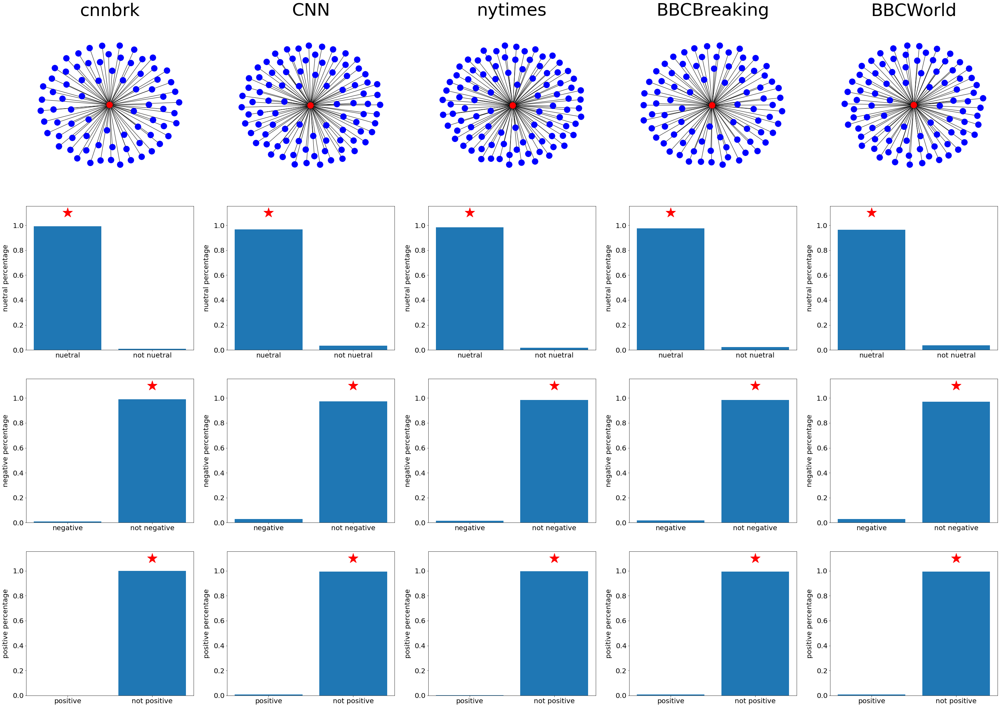

In [ ]:
# Connotations

import networkx as nx

ycounter = 0
fig, axs = plt.subplots(4, 5, figsize = (50,35))

for Verified in Verified_follower_dic:
  
  User_name = str(id_name_df[id_name_df['user_id'] == Verified]['user_name'].iloc[0])
  # Making our Network Here
  df_test = pd.DataFrame({'Source':Verified_follower_dic[Verified]})
  df_test['Target'] = Verified
  df_test['Type'] = 'Unidirected'


  G = nx.from_pandas_edgelist(df_test,source='Source',target = 'Target')
  color_map = []
  for node in G:
    if node == Verified:
      color_map.append('red')
    else:
      color_map.append('blue')
  
  # Time to get Unverified OPINION! 
  #Num_opinion = {'nuetral':[],'negative':[],'positive':[],'fear':[], 'trust':[], 'anger':[], 'anticipation':[], 'sadness':[], 'surprise':[], 'disgust':[], 'joy':[]}
  Num_opinion = {'nuetral':[],'negative':[],'positive':[]}

  Percent_opinion = {}

  tot_tweets = 0
  
  for entry in Verified_follower_dic[Verified]:
    index = predicted_df['user_id'] == entry
    df_of_user = predicted_df[index]
    tot_tweets += len(df_of_user)
    user_opinions = dict(df_of_user.iloc[:,2:13].sum())
    for op in user_opinions.keys():
      try:
        Num_opinion[op].append(user_opinions[op])
      except:
        None



  for opinion in Num_opinion.keys():
    Percent_opinion[opinion] = sum(Num_opinion[opinion])/tot_tweets

  # Get the Percent Opinion for the Verified
  #Num_opinion_ver = {'nuetral':[],'negative':[],'positive':[],'fear':[], 'trust':[], 'anger':[], 'anticipation':[], 'sadness':[], 'surprise':[], 'disgust':[], 'joy':[]}
  Num_opinion_ver = {'nuetral':[],'negative':[],'positive':[]}
  Percent_opinion_ver = {}


  tot_tweets = 0

  index = predicted_df['user_id'] == Verified
  df_of_user = predicted_df[index]
  tot_tweets += len(df_of_user)
  user_opinions = dict(df_of_user.iloc[:,2:13].sum())
  for op in user_opinions.keys():
    try:
      Num_opinion_ver[op].append(user_opinions[op])
    except:
      None
  

  for opinion in Num_opinion_ver.keys():
    Percent_opinion_ver[opinion] = 1 if sum(Num_opinion_ver[opinion])/tot_tweets > .5 else 0


  nx.draw(G,node_color=color_map,with_labels = False, ax=axs[0,ycounter])
  axs[0,ycounter].set_title(User_name, fontsize = 50,pad = 50)

  counter = 1
  for i in Percent_opinion.keys():
    opinion = Percent_opinion[i]
    anti = 1 - opinion

    ver_opinion = Percent_opinion_ver[i]

    if ver_opinion == 1:
      x = 0
      y = 1.1
    else:
     x = 1
     y = 1.1

    axs[counter,ycounter].bar([i,'not ' + i],[opinion,anti])
    axs[counter,ycounter].set_ylabel(i + ' percentage',fontsize = 20,labelpad = 10)
    axs[counter,ycounter].plot(x,y,'r*',markersize = 30)
    axs[counter,ycounter].tick_params(labelsize = 20)

  

    counter +=1
  ycounter +=1

plt.show()








We can see for each of the 5 Verified Followers and their following networks, the Verified User and their followers have similar opinions for Connotations! This is similar of what we found per label in the previous sections

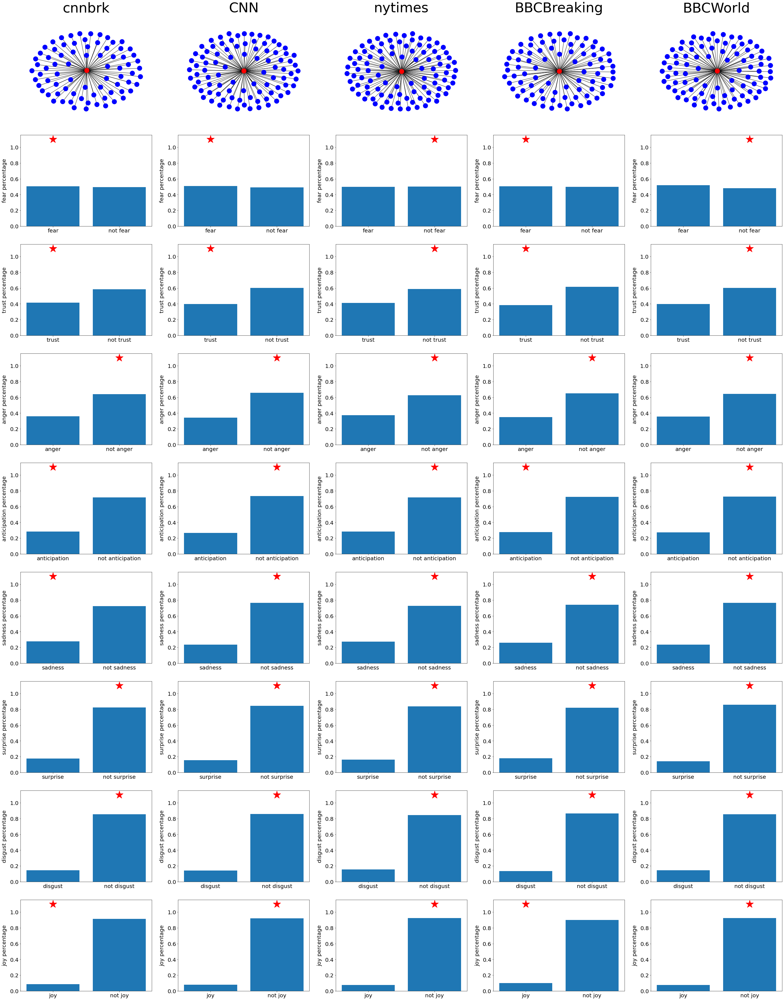

In [ ]:
# Emotions

import networkx as nx

ycounter = 0
fig, axs = plt.subplots(9, 5, figsize = (50,65))

for Verified in Verified_follower_dic:
  
  User_name = str(id_name_df[id_name_df['user_id'] == Verified]['user_name'].iloc[0])
  # Making our Network Here
  df_test = pd.DataFrame({'Source':Verified_follower_dic[Verified]})
  df_test['Target'] = Verified
  df_test['Type'] = 'Unidirected'


  G = nx.from_pandas_edgelist(df_test,source='Source',target = 'Target')
  color_map = []
  for node in G:
    if node == Verified:
      color_map.append('red')
    else:
      color_map.append('blue')
  
  # Time to get Unverified OPINION! 
  Num_opinion = {'fear':[], 'trust':[], 'anger':[], 'anticipation':[], 'sadness':[], 'surprise':[], 'disgust':[], 'joy':[]}

  Percent_opinion = {}

  tot_tweets = 0
  
  for entry in Verified_follower_dic[Verified]:
    index = predicted_df['user_id'] == entry
    df_of_user = predicted_df[index]
    tot_tweets += len(df_of_user)
    user_opinions = dict(df_of_user.iloc[:,2:13].sum())
    for op in user_opinions.keys():
      try:
        Num_opinion[op].append(user_opinions[op])
      except:
        None



  for opinion in Num_opinion.keys():
    Percent_opinion[opinion] = sum(Num_opinion[opinion])/tot_tweets

  # Get the Percent Opinion for the Verified
  Num_opinion_ver = {'fear':[], 'trust':[], 'anger':[], 'anticipation':[], 'sadness':[], 'surprise':[], 'disgust':[], 'joy':[]}
  Percent_opinion_ver = {}


  tot_tweets = 0

  index = predicted_df['user_id'] == Verified
  df_of_user = predicted_df[index]
  tot_tweets += len(df_of_user)
  user_opinions = dict(df_of_user.iloc[:,2:13].sum())
  for op in user_opinions.keys():
    try:
      Num_opinion_ver[op].append(user_opinions[op])
    except:
      None
  

  for opinion in Num_opinion_ver.keys():
    Percent_opinion_ver[opinion] = 1 if sum(Num_opinion_ver[opinion])/tot_tweets > .5 else 0


  nx.draw(G,node_color=color_map,with_labels = False, ax=axs[0,ycounter])
  axs[0,ycounter].set_title(User_name, fontsize = 50,pad = 50)

  counter = 1
  for i in Percent_opinion.keys():
    opinion = Percent_opinion[i]
    anti = 1 - opinion

    ver_opinion = Percent_opinion_ver[i]

    if ver_opinion == 1:
      x = 0
      y = 1.1
    else:
     x = 1
     y = 1.1

    axs[counter,ycounter].bar([i,'not ' + i],[opinion,anti])
    axs[counter,ycounter].set_ylabel(i + ' percentage',fontsize = 20,labelpad = 10)
    axs[counter,ycounter].plot(x,y,'r*',markersize = 30)
    axs[counter,ycounter].tick_params(labelsize = 20)

  

    counter +=1
  ycounter +=1

plt.show()








We can see for each of the 5 Verified Followers and their following networks, the Verified User and their followers DONT have similar opinions for Emotions! This is similar of what we found per label in the previous sections

# 7) Summary

Our findings based on a series of sentiment analyses and language predictions suggest that, while individual users share similar opinions toward the Ukraine War with the prominent Twitter accounts they follow (i.e., useres' opinion leaders), the ways of expressing their emotions about the War do not necessarily align with the opinion leaders they follow. As the figures above indicate, Twitter users show similar stances toward the Ukraine War (i.e., connotations) with their opinion leaders, but how they express their stances via different emotions ranging from anger to joy/hopefulness diverge across users. 

file-20211105-9897-18ahqx2.avif

Thank you **PANDAS** for helping our assignment!!!!!!!

# 8) Appendix 1: Another Unused Bert Model For Negative/Positive Emotion Prediction.


In this section we optimized our BERT model in section 3.3 and we used it to predict postive and negative Tweets. We saw that the model predicted around 50/50 for positive/negative. This made us worried, since we have many nuetral tweets. This appendex helped us realize a Lexicon approach is much better!

## 8.1) Model Performance
See bert model training notebook in our project folder for the original code and more details

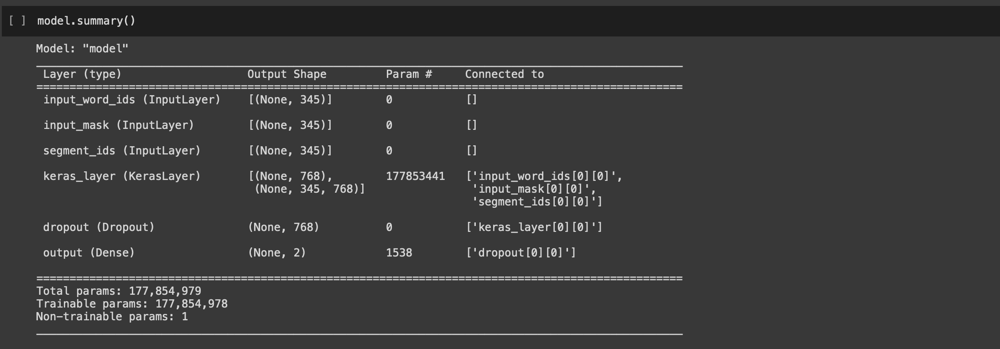

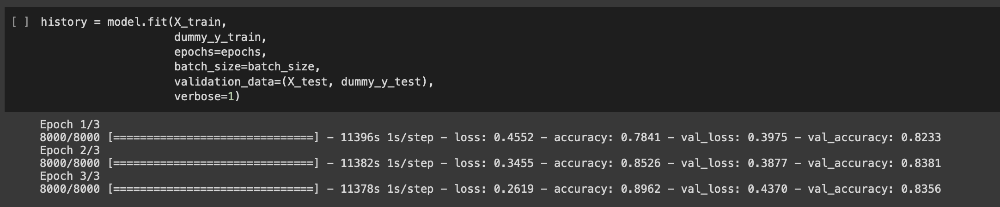

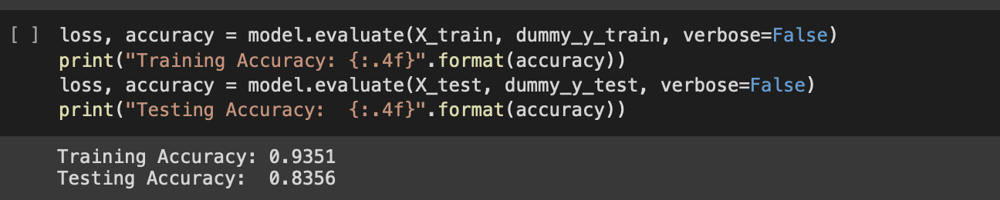

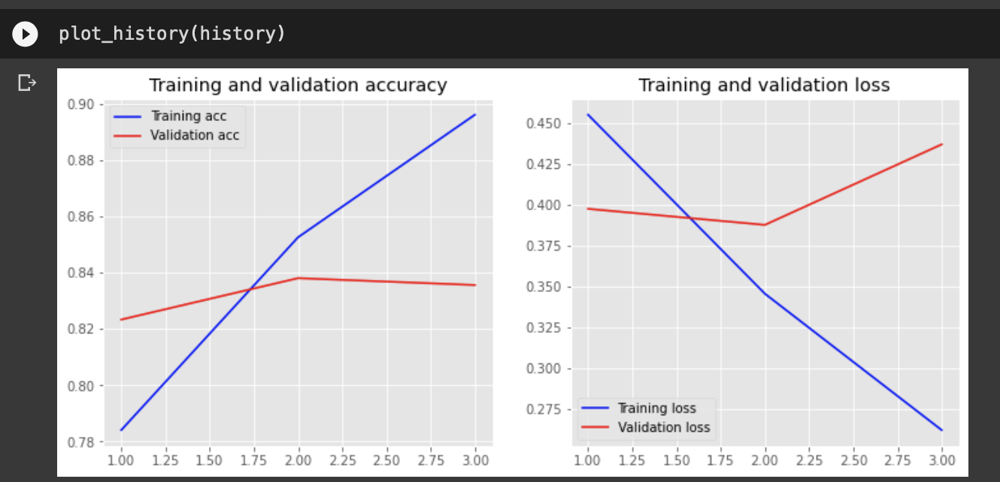

## 8.2) Environment Setup

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sun May  1 00:17:02 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 13.6 gigabytes of available RAM

Not using a high-RAM runtime


In [ ]:
!pip install -q tf-models-official==2.4.0
!pip install -q -U "tensorflow-text==2.8.*"
!pip install tensorflow_hub
!pip install keras tf-models-official pydot graphviz
!git clone https://github.com/tensorflow/models.git

     |████████████████████████████████| 1.1 MB 4.2 MB/s 
     |████████████████████████████████| 237 kB 68.7 MB/s 
     |████████████████████████████████| 1.1 MB 24.2 MB/s 
     |████████████████████████████████| 43 kB 2.2 MB/s 
     |████████████████████████████████| 1.2 MB 49.7 MB/s 
     |████████████████████████████████| 99 kB 11.0 MB/s 
     |████████████████████████████████| 47.8 MB 83.9 MB/s 
     |████████████████████████████████| 596 kB 34.5 MB/s 
     |████████████████████████████████| 352 kB 72.8 MB/s 
     |████████████████████████████████| 462 kB 63.1 MB/s 
     |████████████████████████████████| 4.9 MB 4.3 MB/s 
Cloning into 'models'...
remote: Enumerating objects: 72396, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 72396 (delta 1), reused 8 (delta 1), pack-reused 72384
Receiving objects: 100% (72396/72396), 579.07 MiB | 12.00 MiB/s, done.
Resolving deltas: 100% (51222/51222), done.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

In [ ]:
import os
os.environ['PYTHONPATH'] += ":/content/models"
import sys
sys.path.append("/content/models")

import IPython
import numpy as np
import pandas as pd

import tensorflow as tf
import tensorflow_hub as hub

from keras.utils import np_utils

import official.nlp.bert.bert_models
import official.nlp.bert.configs
import official.nlp.bert.run_classifier
import official.nlp.bert.tokenization as tokenization

from official.modeling import tf_utils
from official import nlp
from official.nlp import bert

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

import matplotlib.pyplot as plt

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)

print("Version: ", tf.__version__)
print("Eager mode: ", tf.executing_eagerly())
print("Hub version: ", hub.__version__)
print("GPU is", "available" if tf.config.list_physical_devices('GPU') else "NOT AVAILABLE")

1 Physical GPUs, 1 Logical GPUs
Version:  2.8.0
Eager mode:  True
Hub version:  0.12.0
GPU is available


## 8.3) Load In The Dataset and The Bert Model

In [ ]:
df = pd.read_json('/content/drive/MyDrive/CIS 545/Ukrain_Russia_tweets_Feb_March_FULLY_Filtered_500K_json.json')
df.head()

,created_at,id,user_id,user_name,user_screen_name,extended_full_text,user_followers_count,reply_count,retweet_count,favorite_count,...,rt_user_screen_name,rt_followers_count,rt_reply_count,rt_retweet_count,rt_favorite_count,rt_user_location,rt_user_verified,day,total_day_tweets_collected,Filtered_extended_text
0,2022-02-09 18:57:04+00:00,1491486324000000000,1376954378595180544,droptown.io,droptown_io,The Russian government and the Bank of Russia ...,146,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220209,1325849,The Russian government and the Bank of Russia ...
3,2022-02-09 18:11:08+00:00,1491474764000000000,1170848942784995328,Alexander,Alexand65504397,Life Under the Specter of War: Images From Ukr...,7,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220209,1325849,Life Under the Specter of War: Images From Ukr...
5,2022-02-09 01:16:35+00:00,1491219444000000000,1174009099824128000,James Rath,JamesRa27165926,@ani_obsessive I honestly don't think anything...,11,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220209,1325849,ani_obsessive I honestly don't think anything ...
7,2022-02-09 06:53:19+00:00,1491304186000000000,1473016153467506688,Limited USD (LUSD),LimitedCurrency,"@APompliano Hi Pomp, at https://t.co/nT0Pji6SX...",11263,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220209,1325849,"APompliano Hi Pomp, at community we just crea..."
13,2022-02-09 06:26:19+00:00,1491297391000000000,92895963,Samar Hashemi,samarhashemi,Another possible doping situation for Russia? ...,231,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220209,1325849,Another possible doping situation for Russia? ...


In [ ]:
model_fname = 'twitter_BERT'
my_wd = '/content/drive/MyDrive/CIS 545'

bert_model = tf.keras.models.load_model(os.path.join(my_wd, model_fname))

In [ ]:
bert_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_word_ids (InputLayer)    [(None, 240)]        0           []                               
                                                                                                  
 input_mask (InputLayer)        [(None, 240)]        0           []                               
                                                                                                  
 segment_ids (InputLayer)       [(None, 240)]        0           []                               
                                                                                                  
 keras_layer (KerasLayer)       [(None, 768),        177853441   ['input_word_ids[0][0]',         
                                 (None, 240, 768)]                'input_mask[0][0]',         

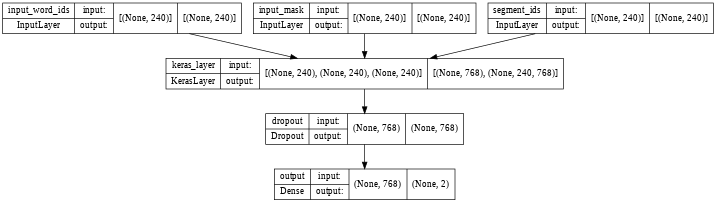

In [ ]:
tf.keras.utils.plot_model(bert_model, show_shapes=True, dpi=48)

## 8.4)Text Preprocessing

### Removing special characters, white space and tabs

In [ ]:
x_test = df['Filtered_extended_text']
x_test = x_test.reset_index()

In [ ]:
import re

def remove_extra_whitespace_tabs(text):
    #pattern = r'^\s+$|\s+$'
    pattern = r'^\s*|\s\s*'
    return re.sub(pattern, ' ', text).strip()

# function to remove special characters
def remove_special_characters(text):
    # define the pattern to keep
    text = text.replace('-', ' ')
    pat = r'[^a-zA-z0-9.,!?/:;\"\'\s]' 
    return re.sub(pat, '', text)
 
x_test['Filtered_extended_text'] = x_test['Filtered_extended_text'].apply(lambda x: remove_special_characters(x))
x_test['Filtered_extended_text'] = x_test['Filtered_extended_text'].apply(lambda x: remove_extra_whitespace_tabs(x))

In [ ]:
x_test

,index,Filtered_extended_text
0,0,The Russian government and the Bank of Russia ...
1,3,Life Under the Specter of War: Images From Ukr...
2,5,ani_obsessive I honestly don't think anything ...
3,7,"APompliano Hi Pomp, at community we just creat..."
4,13,Another possible doping situation for Russia? ...
...,...,...
466542,1867809,thereality031 Real_Jayant RT_com Look like Rus...
466543,1867811,"The IAEA has 172 employees, 40 of whom are Rus..."
466544,1867814,"Google: Russian phishing attacks target NATO, ..."
466545,1867815,telegram Could you tell the world why youve re...


### Tokenization

In [ ]:
tokenizerSaved = bert.tokenization.FullTokenizer(
    vocab_file=os.path.join(my_wd, model_fname, 'assets/vocab.txt'),
    do_lower_case=False)

In [ ]:
tokenizedTweet = tokenizerSaved.tokenize(x_test['Filtered_extended_text'][0])
for i in tokenizedTweet:
  print(i, tokenizerSaved.convert_tokens_to_ids([i]))

The [10117]
Russian [13463]
government [12047]
and [10111]
the [10105]
Bank [13533]
of [10108]
Russia [14664]
look [25157]
to [10114]
have [10529]
c [171]
##ry [10908]
##pt [14971]
##o [10133]
regulated [106125]
as [10146]
cu [10854]
##rren [46111]
##cies [18320]
, [117]
local [11436]
reports [26610]
have [10529]
suggested [27675]
. [119]
Russia [14664]
is [10124]
set [11847]
to [10114]
formally [43082]
re [11639]
##co [10812]
##gni [27170]
##se [10341]
c [171]
##ry [10908]
##pt [14971]
##oc [25125]
##urre [97235]
##ncies [21512]
as [10146]
cu [10854]
##rren [46111]
##cies [18320]
, [117]
news [14424]
reports [26610]
out [10950]
of [10108]
the [10105]
country [12723]
suggest [56874]
. [119]
Cry [33909]
##pt [14971]
##o [10133]


In [ ]:
x_test['Filtered_extended_text'][0]

'The Russian government and the Bank of Russia look to have crypto regulated as currencies, local reports have suggested. Russia is set to formally recognise cryptocurrencies as currencies, news reports out of the country suggest. Crypto'

In [ ]:
bert_layer = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_multi_cased_L-12_H-768_A-12/2",
                            trainable=True)

In [ ]:
vocab_file = bert_layer.resolved_object.vocab_file.asset_path.numpy()
do_lower_case = bert_layer.resolved_object.do_lower_case.numpy()
tokenizer = tokenization.FullTokenizer(vocab_file, do_lower_case)

In [ ]:
tokenizer.convert_tokens_to_ids(['[CLS]', '[SEP]'])

[101, 102]

In [ ]:
def encode_names(n):
   tokens = list(tokenizer.tokenize(n))
   tokens.append('[SEP]')  # seperation token. Would be much more useful if you had a multiple text input.
   return tokenizer.convert_tokens_to_ids(tokens)

tweets = tf.ragged.constant([
    encode_names(n) for n in x_test['Filtered_extended_text']])


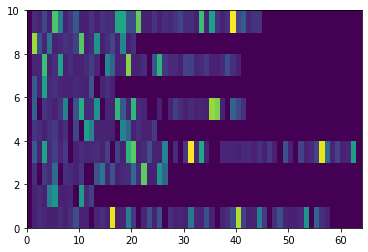

In [ ]:
cls = [tokenizer.convert_tokens_to_ids(['[CLS]'])]*tweets.shape[0]
input_word_ids = tf.concat([cls, tweets], axis=-1)
_ = plt.pcolormesh(input_word_ids[0:10].to_tensor())

In [ ]:
def encode_names(n, tokenizer):
   tokens = list(tokenizer.tokenize(n))
   tokens.append('[SEP]')
   return tokenizer.convert_tokens_to_ids(tokens)

def bert_encode(string_list, tokenizer, max_seq_length):
  num_examples = len(string_list)
  
  string_tokens = tf.ragged.constant([
      encode_names(n, tokenizer) for n in np.array(string_list)])

  cls = [tokenizer.convert_tokens_to_ids(['[CLS]'])]*string_tokens.shape[0]
  input_word_ids = tf.concat([cls, string_tokens], axis=-1)
  

  input_mask = tf.ones_like(input_word_ids).to_tensor(shape=(None, max_seq_length))

  type_cls = tf.zeros_like(cls)
  type_tokens = tf.ones_like(string_tokens)
  input_type_ids = tf.concat(
      [type_cls, type_tokens], axis=-1).to_tensor(shape=(None, max_seq_length))

  inputs = {
      'input_word_ids': input_word_ids.to_tensor(shape=(None, max_seq_length)),
      'input_mask': input_mask,
      'input_type_ids': input_type_ids}

  return inputs

In [ ]:
encoder_fname = 'twitter_classes.npy'
my_wd = '/content/drive/MyDrive/CIS 545'

encoder = LabelEncoder()
encoder.classes_ = np.load(os.path.join(my_wd, encoder_fname), allow_pickle=True)

In [ ]:
twt = ['i hate you']
input = bert_encode(string_list=list(twt),
              tokenizer=tokenizerSaved, 
              max_seq_length=240)
  
prediction1 = bert_model.predict(input)

##8.5) Model Predicting 

In [ ]:
twts = x_test['Filtered_extended_text'].iloc[:1000]
prediction = []

for i in twts:
  twt = [i]
  input = bert_encode(string_list=list(twt), 
                tokenizer=tokenizerSaved, 
                max_seq_length=240)

  prediction1 = bert_model.predict(input)
  if encoder.classes_[np.argmax(prediction1)]==4:
    prediction.append('positive')
  else:
    prediction.append('negative')

prediction

['negative',
 'positive',
 'positive',
 'positive',
 'negative',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'positive',
 'positive',
 'negative',
 'negative',
 'negative',
 'negative',
 'positive',
 'negative',
 'positive',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'positive',
 'positive',
 'negative',
 'negative',
 'negative',
 'positive',
 'negative',
 'positive',
 'negative',
 'positive',
 'negative',
 'negative',
 'positive',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'positive',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'positive',
 'negative',
 'negative',
 'positive',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',

##8.6) Visualization

In [ ]:
# label = pd.DataFrame({'predicted_emotion': prediction})
emo_df = df[['user_id', 'user_verified', 'day', 'favorite_count']].iloc[:1000]
emo_df['predicted_emotion'] = prediction

In [ ]:
from matplotlib import pyplot as plt

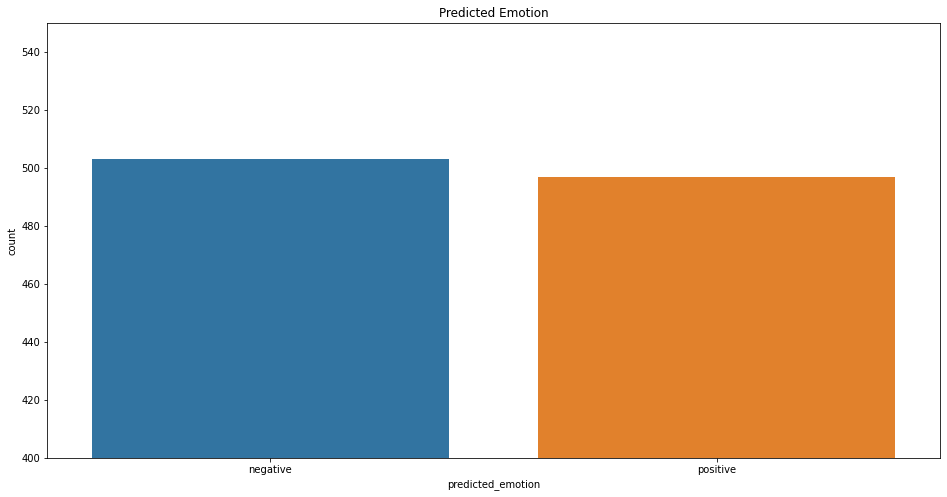

In [ ]:
import seaborn as sns
plt.figure(figsize=(16,8));
ax = sns.countplot(x="predicted_emotion",data=emo_df)
plt.ylim(400, 550);
plt.title('Predicted Emotion');
